# What Are Satellite Images?

Satellite images are multi-dimensional representations of Earth’s surface, captured by sensors onboard satellites. Unlike standard RGB images, satellite images often include multiple spectral bands beyond visible light, such as near-infrared (NIR), short-wave infrared (SWIR), thermal, and more.

---

# What Are Spectral Bands?
Each band captures reflectance at a specific wavelength of the electromagnetic spectrum. A single satellite image can have:
- 🟥 Red, 🟩 Green, 🟦 Blue (Visible)
- **Near Infrared (NIR)** — used for vegetation and water
- **Short-Wave Infrared (SWIR)** — used for soil/moisture
- **Thermal Infrared (TIR)** — used for temperature sensing
-  Other spectral bands depending on the satellite

---
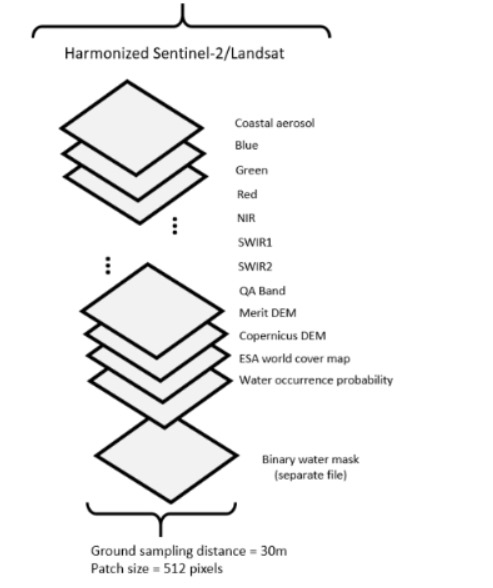
# Typical Band Combinations:
|**Band Type**|**Wavelength (nm)**|**Use Case**|
|-------------|-------------------|------------|
|`Blue`|~450|Water bodies, bathymetry|
|`Green`|~550|Vegetation, urban features|
|`Red`|~650|Land cover, built-up area|
|`NIR`|~850|Vegetation health, water contrast|
|`SWIR-1`|~1600|Moisture, snow/ice, burn area|
|`SWIR-2`|~2200|Soil, vegetation stress|
|`TIR`|~11,000+|Heat signatures, fire detection|

---

# 📂 Satellite Image Formats
- `.tif` / `.tiff`: Common GeoTIFF format — supports multi-band raster data
- `.npz` / `.npy`: Often used for deep learning after preprocessing
- `.jp2` / `.hdf5`: Other scientific image formats

---

#  Why Multiple Bands Matter in Deep Learning
Different surfaces (like water, vegetation, soil) reflect light differently at each wavelength. Deep learning models can exploit these differences to:
- 🌊 Detect water boundaries more clearly using `NIR` and `SWIR`
- 🌱 Distinguish healthy vs. stressed vegetation
- 🌇 Differentiate urban vs. rural land cover

---

# 🛠️ Preparing Satellite Images for Deep Learning
1. Normalize Each Band: Zero-mean and unit-variance (per band)
2. Resize if needed: Pad/crop to fixed shape (e.g. 128x128)
3. Augment Carefully: Don’t destroy spectral relationships

1. What makes water segmentation difficult?
  - Similar reflectance in NIR/SWIR with wet soil, shadow, urban areas
  - Water bodies vary by depth, pollution, clarity, sun angle
  1. Spectral Similarity
    - Water can appear similar to shadows, asphalt, and wet soil in visible bands.
    - Especially hard to detect in urban areas and mountainous regions.
  2. Dynamic Appearance
    - Water surfaces change due to wind, waves, depth, turbidity, and sun reflection.
    - Cloud cover, haze, and seasonal variation can distort pixel values.
  3. Label Ambiguity
    - Manual labeling of water is often error-prone.
    - Thin rivers, shorelines, and wetlands are hard to annotate.
---

2. Which bands are best for water detection?
  - NDWI (Normalized Difference Water Index) = (Green − NIR) / (Green + NIR)
  - MNDWI (Modified) = (Green − SWIR) / (Green + SWIR)
  - These use Band 3 (green), Band 5 (NIR), Band 6/7 (SWIR)

|Band|Wavelength (nm)|Role in Water Detection|
|----|---------------|-----------------------|
|`Green`|	~550	|Highlights vegetation/water boundary|
|`NIR`|	~850|	Water absorbs NIR → appears dark|
|`SWIR1`|	~1600	|Enhances contrast between water and soil|
|`SWIR2`|	~2200	|Useful for identifying moisture & ice|

**Popular Spectral Indices for Water**

These indices use mathematical operations on bands to highlight water features:

|Index	|Formula	|Use Case|
|-------|---------|--------|
|`NDWI`	|(`Green` − `NIR`) / (`Green` + `NIR`)	|Most common — works well in vegetation areas|
|`MNDWI`|	(`Green` − `SWIR`) / (`Green` + `SWIR`)	|Better contrast in urban areas|
|`AWEI`	|Multi-band combination (`SWIR`/`NIR`)	|Handles shadow, built-up areas, and haze|

---

3. What deep learning methods are used in literature?
 - U-Net, DeepLabV3+, and SegFormer dominate
 - Some use auxiliary tasks like NDWI estimation or unsupervised learning
 - Models often use patch-level training (128×128 or 256×256)

| Model               | Description                           | Notes                         |
| ------------------- | ------------------------------------- | ----------------------------- |
| **U-Net**           | Encoder-decoder with skip connections | Strong baseline               |
| **ResU-Net**        | Adds residuals to U-Net               | Improves training stability   |
| **Attention U-Net** | Focuses on key areas of image         | Better for cluttered scenes   |
| **DeepLabV3+**      | Atrous convolutions + encoder-decoder | Robust for complex boundaries |
| **SegFormer**       | Transformer-based segmentation        | Lightweight and accurate      |

---
🧪 Evaluation Metrics for Segmentation

| Metric|Description|
|-------|-----------|
|**IoU** (Intersection over Union)| Overlap between predicted & ground truth masks |
| **F1 Score**                      | Combines precision & recall                    |
| **Precision**                     | Measures false positives                       |
| **Recall**                        | Measures false negatives                       |
| **Pixel Accuracy**                | % of correctly classified pixels               |




## **0.1 Connect to google colab**

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import os
os.chdir('/content/drive/MyDrive/Cellula/02_Project 2')

## **0.2 Setup the device**

In [5]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## **0.3 Import Dependencies**

In [6]:
!pip install nvidia-pyindex
!pip install nvidia-tensorrt

In [7]:
pip install onnx onnxruntime tensorrt

In [8]:
!pip install torchviz

In [9]:
# ============================#
# 📦 Standard Library Imports
# ============================#
import os
import glob
import random
import time

# ============================#
# 🧮 Numerical and Data Tools
# ============================#
import numpy as np
import pandas as pd

# ============================#
# 📊 Visualization Libraries
# ============================#
import matplotlib.pyplot as plt
from PIL import Image as PILImage
from rich.console import Console
from rich.table import Table
from rich import print as rprint
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
from IPython.display import Image, display
import tqdm

# ============================#
# 🔍 Deep Learning & Torch
# ============================#
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchsummary import summary
from torchviz import make_dot

# ============================#
# 🧠 ONNX / TensorRT Inference
# ============================#
import onnx
import onnxruntime
import tensorrt  # Consider renaming to tensorrt as trt for consistency

# ============================#
# 🗺️ Raster Data Handling
# ============================#
try:
    import rasterio
except ImportError:
    import subprocess
    subprocess.check_call(["pip", "install", "rasterio"])
    import rasterio

# ============================#
# ⚙️ Console for Rich Output
# ============================#
console = Console()

In [10]:
# to get packages initially installed in colab or in other word, the colab environment
!pip3 freeze > requirements.txt

## 📁 **0.4 Setup All Project Paths**

In [11]:
def prepare_folders(base_dir="project"):
    """
    Create required directories for data, results, models, stats, etc.
    """
    folders = [
        "outputs/visuals", "outputs/checkpoints",
        "outputs/models", "outputs/npz", "outputs/stats"
    ]

    for folder in folders:
        full_path = os.path.join(base_dir, folder)
        os.makedirs(full_path, exist_ok=True)
        console.log(f"[green]✔ Created folder:[/green] {full_path}")

    rprint("[bold cyan]✅ All folders are ready![/bold cyan]")

prepare_folders()

[17:34:24] ✔ Created folder: project/outputs/visuals                               ]8;id=75195;file:///tmp/ipython-input-11-669953086.py\ipython-input-11-669953086.py]8;;\:]8;id=925726;file:///tmp/ipython-input-11-669953086.py#13\13]8;;\

           ✔ Created folder: project/outputs/checkpoints                           ]8;id=441406;file:///tmp/ipython-input-11-669953086.py\ipython-input-11-669953086.py]8;;\:]8;id=943642;file:///tmp/ipython-input-11-669953086.py#13\13]8;;\

           ✔ Created folder: project/outputs/models                                ]8;id=873174;file:///tmp/ipython-input-11-669953086.py\ipython-input-11-669953086.py]8;;\:]8;id=613265;file:///tmp/ipython-input-11-669953086.py#13\13]8;;\

           ✔ Created folder: project/outputs/npz                                   ]8;id=499389;file:///tmp/ipython-input-11-669953086.py\ipython-input-11-669953086.py]8;;\:]8;id=497024;file:///tmp/ipython-input-11-669953086.py#13\13]8;;\

           ✔ Created folder: project/outputs/stats                                 ]8;id=176394;file:///tmp/ipython-input-11-669953086.py\ipython-input-11-669953086.py]8;;\:]8;id=998142;file:///tmp/ipython-input-11-669953086.py#13\13]8;;\

✅ All folders are ready!

## **📦 0.5 Define Data Paths**

In [12]:
# Root project path
ROOT = "project"
IMG_DIR = "data/images"
LABEL_DIR = "data/labels"
RESULTS_DIR = os.path.join(ROOT, "outputs")
VISUAL_DIR = os.path.join(RESULTS_DIR, "visuals")
NPZ_DIR = os.path.join(RESULTS_DIR, "npz")

# List image and label files
image_paths = sorted(glob.glob(os.path.join(IMG_DIR, "*.tif")))
label_paths = sorted(glob.glob(os.path.join(LABEL_DIR, "*.png")))

console.rule("[bold yellow] Dataset Summary[/bold yellow]")
table = Table(title="Water Segmentation Dataset")

table.add_column("Field", style="bold cyan")
table.add_column("Value", style="white")

table.add_row("Number of Images", str(len(image_paths)))
table.add_row("Number of Masks", str(len(label_paths)))
console.print(table)

────────────────────────────────────────────────  Dataset Summary ─────────────────────────────────────────────────

 Water Segmentation Dataset 
┏━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃ Field            ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│ Number of Images │ 306   │
│ Number of Masks  │ 456   │
└──────────────────┴───────┘

**Mismatched Image & Mask Counts**

- 306 `.tif` images
- 456 `.png` masks

That’s a mismatch, and we should only keep pairs where both image and mask exist (i.e., matching filenames like 0.tif & 0.png).

In [13]:
def get_matched_image_label_paths(img_dir, label_dir):
    image_files = sorted(glob.glob(os.path.join(img_dir, "*.tif")))
    label_files = sorted(glob.glob(os.path.join(label_dir, "*.png")))

    matched_images, matched_labels = [], []
    for img_path in image_files:
        fname = os.path.splitext(os.path.basename(img_path))[0]
        lbl_path = os.path.join(label_dir, f"{fname}.png")
        if os.path.exists(lbl_path):
            matched_images.append(img_path)
            matched_labels.append(lbl_path)

    return matched_images, matched_labels

In [14]:
image_paths, label_paths = get_matched_image_label_paths(IMG_DIR, LABEL_DIR)

In [15]:
console.print(table)

 Water Segmentation Dataset 
┏━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃ Field            ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│ Number of Images │ 306   │
│ Number of Masks  │ 456   │
└──────────────────┴───────┘

In [16]:
def summarize_file_counts(image_dir, label_dir):
    all_images = sorted(glob.glob(os.path.join(image_dir, "*.tif")))
    all_labels = sorted(glob.glob(os.path.join(label_dir, "*.png")))

    image_names = {os.path.splitext(os.path.basename(p))[0] for p in all_images}
    label_names = {os.path.splitext(os.path.basename(p))[0] for p in all_labels}

    missing_labels = image_names - label_names
    missing_images = label_names - image_names
    matched = image_names & label_names

    return {
        "images": all_images,
        "labels": all_labels,
        "matched_ids": sorted(matched),
        "missing_labels": sorted(missing_labels),
        "missing_images": sorted(missing_images),
    }

In [17]:
def print_mismatch_summary(summary_dict):
    table = Table(title="🧠 Dataset Consistency Check", show_lines=True)
    table.add_column("Metric", style="cyan", justify="left")
    table.add_column("Value", style="white", justify="right")

    table.add_row("📸 Total Images Found", str(len(summary_dict["images"])))
    table.add_row("🖼 Total Masks Found", str(len(summary_dict["labels"])))
    table.add_row("✅ Matched Pairs", str(len(summary_dict["matched_ids"])))
    table.add_row("❌ Images Missing Labels", str(len(summary_dict["missing_labels"])))
    table.add_row("❌ Labels Missing Images", str(len(summary_dict["missing_images"])))

    console.print(table)

In [18]:
def get_clean_image_label_paths(image_dir, label_dir, matched_ids):
    images = [os.path.join(image_dir, f"{img_id}.tif") for img_id in matched_ids]
    labels = [os.path.join(label_dir, f"{img_id}.png") for img_id in matched_ids]
    return images, labels

In [19]:
dataset_summary = summarize_file_counts(IMG_DIR, LABEL_DIR)
print_mismatch_summary(dataset_summary)

    🧠 Dataset Consistency Check    
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃ Metric                   ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│ 📸 Total Images Found    │   306 │
├──────────────────────────┼───────┤
│ 🖼 Total Masks Found      │   456 │
├──────────────────────────┼───────┤
│ ✅ Matched Pairs         │   306 │
├──────────────────────────┼───────┤
│ ❌ Images Missing Labels │     0 │
├──────────────────────────┼───────┤
│ ❌ Labels Missing Images │   150 │
└──────────────────────────┴───────┘

In [20]:
dataset_summary = summarize_file_counts(IMG_DIR, LABEL_DIR)
image_paths, label_paths = get_clean_image_label_paths(IMG_DIR, LABEL_DIR, dataset_summary["matched_ids"])
rprint(f"[bold green]✅ Cleaned pairs ready for training:[/bold green] {len(image_paths)} samples")

✅ Cleaned pairs ready for training: 306 samples

# 1. **1. Spectral Band Explorer**

In [21]:
BAND_LABELS = {
    0: "🌊 Coastal Blue",
    1: "🔵 Blue",
    2: "🟢 Green (NDWI)",
    3: "🔴 Red",
    4: "🌿 NIR",
    5: "🔥 SWIR-1",
    6: "❄️ SWIR-2",
    7: "🌡️ Thermal IR",
    8: "🛰 Panchromatic",
    9: "☁ Cloud Mask",
    10: "⚠️ QA Band",
    11: "📏 DEM / Extra",
    12: "🌊 NDWI (Derived)",
    13: "🏙️ MNDWI (Derived)",
    14: "💧 AWEI (Derived)"
}

In [22]:
def visualize_bands_with_rgb_and_correlation(image_paths, label_paths, num_samples=5):
    indices = random.sample(range(len(image_paths)), min(num_samples, len(image_paths)))
    global_corr_list = []

    for idx in indices:
        # === Load image and mask ===
        with rasterio.open(image_paths[idx]) as src:
            img = src.read().astype(np.float32)  # shape: (bands, H, W)
        mask = np.array(PILImage.open(label_paths[idx])).astype(np.float32)
        mask_bin = (mask > 0).astype(np.float32)

        # Skip if mask is constant
        if mask_bin.max() == mask_bin.min():
            print(f"⚠️ Skipping sample {idx} (mask is constant)")
            continue

        # === Derived Indices ===
        GREEN = img[2]
        NIR = img[7]
        SWIR = img[10]
        ndwi = (GREEN - NIR) / (GREEN + NIR + 1e-7)
        mndwi = (GREEN - SWIR) / (GREEN + SWIR + 1e-7)
        awei = 4 * (GREEN - SWIR) - (0.25 * NIR + 2.75 * SWIR)

        # === RGB Composite ===
        rgb = np.stack([img[3], img[2], img[1]], axis=-1)
        rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-7)

        # === Correlation Computation ===
        correlations = {}
        for i in range(img.shape[0]):
            corr = np.corrcoef(img[i].flatten(), mask_bin.flatten())[0, 1]
            correlations[f"Band {i+1}"] = 0.0 if np.isnan(corr) else corr
        for name, arr in zip(["NDWI", "MNDWI", "AWEI"], [ndwi, mndwi, awei]):
            corr = np.corrcoef(arr.flatten(), mask_bin.flatten())[0, 1]
            correlations[name] = 0.0 if np.isnan(corr) else corr

        corr_df = pd.DataFrame(list(correlations.items()), columns=["Band/Index", "Correlation"])
        corr_df = corr_df.sort_values("Correlation", ascending=False)
        print(f"\n=== Correlation Ranking for Sample {idx} ===")
        print(corr_df)
        global_corr_list.append(correlations)

        # === Titles and number of subplots ===
        titles = ["RGB Composite"] + [f"Band {i+1}" for i in range(img.shape[0])] + ["NDWI", "MNDWI", "AWEI", "Mask"]
        total_plots = len(titles)
        rows = int(np.ceil(total_plots / 4))
        fig = sp.make_subplots(rows=rows, cols=4, subplot_titles=titles)

        # === Add RGB ===
        fig.add_trace(go.Image(z=(rgb * 255).astype(np.uint8)), row=1, col=1)

        # === Add bands ===
        r, c = 1, 2
        for i in range(img.shape[0]):
            fig.add_trace(go.Heatmap(z=img[i], colorscale="Viridis", showscale=False), row=r, col=c)
            c += 1
            if c == 5:
                r, c = r + 1, 1

        # === Add indices + mask ===
        for arr, name in zip([ndwi, mndwi, awei, mask_bin], ["NDWI", "MNDWI", "AWEI", "Mask"]):
            fig.add_trace(go.Heatmap(z=arr, colorscale="Viridis" if name != "Mask" else "gray", showscale=False), row=r, col=c)
            c += 1
            if c == 5:
                r, c = r + 1, 1

        fig.update_layout(
            height=300 * rows, width=1000,
            title=dict(text=f"<b>Sample {idx} - RGB, Bands & Indices</b>", x=0.5, font=dict(size=24, color="cyan")),
            template="plotly_dark"
        )
        fig.show()

    # === Global Average Correlation Ranking ===
    if global_corr_list:
        df_global = pd.DataFrame(global_corr_list)
        mean_corr = df_global.mean().sort_values(ascending=False)
        print("\n=== Global Average Correlation Ranking ===")
        print(mean_corr)


In [23]:
visualize_bands_with_rgb_and_correlation(image_paths, label_paths, num_samples=5)

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)



=== Correlation Ranking for Sample 80 ===
   Band/Index  Correlation
11    Band 12     0.561719
7      Band 8     0.408277
10    Band 11     0.336255
3      Band 4    -0.128867
2      Band 3    -0.163929
14       AWEI    -0.208080
1      Band 2    -0.232413
0      Band 1    -0.271471
12       NDWI    -0.387878
13      MNDWI    -0.398072
9     Band 10    -0.455020
6      Band 7    -0.525218
8      Band 9    -0.577524
5      Band 6    -0.611754
4      Band 5    -0.649474


/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning:

Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.




=== Correlation Ranking for Sample 91 ===
   Band/Index  Correlation
11    Band 12     0.550882
10    Band 11     0.426399
7      Band 8     0.242493
3      Band 4    -0.258414
2      Band 3    -0.263190
12       NDWI    -0.288296
1      Band 2    -0.305241
0      Band 1    -0.349086
14       AWEI    -0.352204
13      MNDWI    -0.463074
9     Band 10    -0.537557
8      Band 9    -0.589817
6      Band 7    -0.609121
5      Band 6    -0.654380
4      Band 5    -0.680500


/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning:

Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.




=== Correlation Ranking for Sample 203 ===
   Band/Index  Correlation
11    Band 12     0.482650
7      Band 8     0.401970
10    Band 11     0.330799
3      Band 4    -0.144893
2      Band 3    -0.238626
1      Band 2    -0.290044
14       AWEI    -0.324414
13      MNDWI    -0.350090
12       NDWI    -0.368132
0      Band 1    -0.371229
9     Band 10    -0.399860
6      Band 7    -0.538874
5      Band 6    -0.561241
4      Band 5    -0.584603
8      Band 9    -0.590204


/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning:

Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.



⚠️ Skipping sample 260 (mask is constant)

=== Correlation Ranking for Sample 236 ===
   Band/Index  Correlation
11    Band 12     0.869958
10    Band 11     0.621134
7      Band 8     0.277734
8      Band 9    -0.141112
9     Band 10    -0.143390
2      Band 3    -0.263482
1      Band 2    -0.332024
0      Band 1    -0.337431
14       AWEI    -0.342630
3      Band 4    -0.387578
12       NDWI    -0.455944
6      Band 7    -0.484376
5      Band 6    -0.527167
4      Band 5    -0.586881
13      MNDWI    -0.822427



=== Global Average Correlation Ranking ===
Band 12    0.616302
Band 11    0.428647
Band 8     0.332619
Band 4    -0.229938
Band 3    -0.232307
Band 2    -0.289931
AWEI      -0.306832
Band 1    -0.332304
NDWI      -0.375062
Band 10   -0.383957
Band 9    -0.474664
MNDWI     -0.508416
Band 7    -0.539397
Band 6    -0.588636
Band 5    -0.625364
dtype: float64


Observation & Feature Selection Strategy

After analyzing multiple samples from the dataset and computing the Pearson correlation between each spectral band / derived index and the water segmentation mask, we observe a clear trend:

  * Band 8 (Panchromatic) and Band 11 (DEM/Extra) show the highest positive correlation with water features.

  * Band 12 also provides relevant spatial information, although slightly less correlated.

  * Derived indices NDWI and MNDWI, which are typically designed for water detection, show negative correlation in our dataset. This indicates that the spectral response of our data might differ from standard Sentinel-2 or Landsat assumptions (e.g., due to sensor differences, region characteristics, or preprocessing steps).

  * Bands 9 and 10 show weak or negative correlation, and several visible bands (1–5) also show low correlation or inverse relation to water regions.

Conclusion:

Instead of being limited to 3 RGB-like channels, we will combine the top-performing spectral bands (8, 11, 12) with selected derived indices (NDWI, MNDWI, AWEI) to form a multi-channel composite image.
This creates an information-rich input tensor that can be projected or reduced to fit the pre-trained model while retaining the most discriminative features for water segmentation.

# **2. Data Preprocessing & Normalization Engine**
- Loads `.tif` image and `.png` mask
- Normalizes each band (zero-mean, unit-variance)
-  Ensures shapes are consistent: (12, 128, 128) for image, (1, 128, 128) for mask


Preprocessing: Image and Mask

This function `preprocess_image_mask()` is responsible for loading and preparing the raw satellite data for training. It performs the following steps:

1. Satellite Image (Multispectral)
  - Loads the input image using `rasterio`, which typically contains **12 spectral bands**.
  - Applies **per-band normalization** (zero-mean, unit-variance) to standardize input features across samples.
  - Final image shape: **(12, height, width)**

2. Segmentation Mask (Water / Non-water)
  - Loads the mask image and resizes it to **128×128 pixels**.
  - Converts to grayscale (if not already).
  - Ensures it's binary: values are **0.0 or 1.0**, using a threshold if needed.
  - Adds a channel dimension → final shape: **(1, 128, 128)**

3. Output
  - Returns the normalized image and binarized mask as NumPy arrays.


In [24]:
def preprocess_image_mask(image_path, mask_path):
    """
    Preprocess satellite image and its segmentation mask.
    - Keep Blue, Green, Red for visualization.
    - Add selected high-correlation bands (8, 11, 12) and indices (NDWI, MNDWI, AWEI).
    - Normalize per channel.
    - Prepare binary mask.

    Returns:
        image: np.ndarray (9, 128, 128)
        mask: np.ndarray (1, 128, 128)
    """
    # --- Load multispectral image (12 bands) ---
    with rasterio.open(image_path) as src:
        img = src.read().astype(np.float32)  # shape: (12, H, W)

    # --- RGB Bands ---
    blue = img[1]   # Band 2 (Blue)
    green = img[2]  # Band 3 (Green)
    red = img[3]    # Band 4 (Red)

    # --- High-correlation Bands ---
    band8 = img[7]   # Panchromatic
    band11 = img[10] # DEM/Extra
    band12 = img[11] # Extra band

    # --- Derived indices ---
    ndwi = (green - band8) / (green + band8 + 1e-7)
    mndwi = (green - band11) / (green + band11 + 1e-7)
    awei = 4 * (green - band11) - (0.25 * band8 + 2.75 * band11)

    # --- Stack final 9 channels ---
    image = np.stack([blue, green, red, band8, band11, band12, ndwi, mndwi, awei], axis=0)

    # --- Normalize each channel ---
    image = (image - image.mean(axis=(1, 2), keepdims=True)) / \
            (image.std(axis=(1, 2), keepdims=True) + 1e-7)

    # --- Process mask ---
    mask = PILImage.open(mask_path).convert("L").resize((128, 128), PILImage.NEAREST)
    mask = np.array(mask)
    mask = (mask > 127).astype(np.float32) if mask.max() > 1 else mask.astype(np.float32)
    mask = mask[None, :, :]

    rprint(f"[bold blue]🧪 {os.path.basename(mask_path)} → Final shape: {image.shape}, Mask unique: {np.unique(mask)}[/bold blue]")
    return image, mask

In [25]:
def print_band_statistics(image):
    table = Table(title="📊 Normalized Band Stats", show_lines=True)
    table.add_column("Band", style="cyan", justify="center")
    table.add_column("Mean", justify="center")
    table.add_column("Std Dev", justify="center")

    for i in range(image.shape[0]):
        band = image[i]
        table.add_row(f"{i+1}", f"{band.mean():.4f}", f"{band.std():.4f}")

    console.print(table)

In [26]:
def visualize_image_and_mask(image, mask, title="Sample"):
    """
    Show RGB image and mask side-by-side.
    """
    # Reconstruct RGB from our stacked channels (Blue, Green, Red are first 3)
    rgb = np.stack([image[2], image[1], image[0]], axis=-1)  # (H, W, 3)
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-7)

    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(rgb)
    axs[0].set_title("RGB Composite")
    axs[1].imshow(mask.squeeze(), cmap="gray")
    axs[1].set_title("Mask")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

✅ Matched samples: 306


/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning:

Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.



🧪 0.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

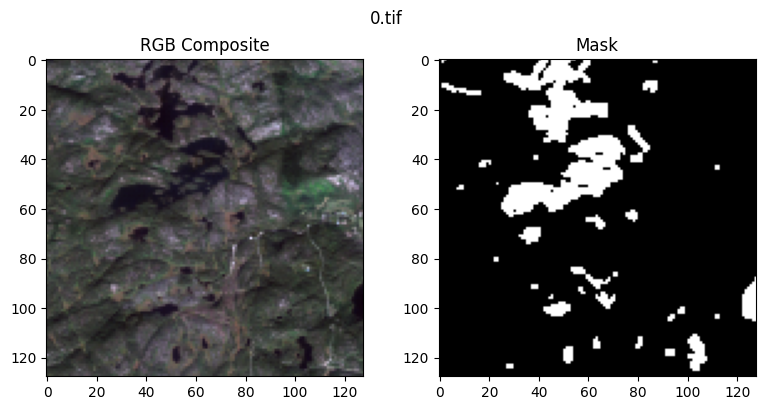

In [27]:
print("✅ Matched samples:", len(image_paths))
img, msk = preprocess_image_mask(image_paths[0], label_paths[0])
visualize_image_and_mask(img, msk, title=os.path.basename(image_paths[0]))

In [28]:
def visualize_image_and_mask(image, mask, title="Sample"):
    """
    Plot the first band of the image + mask side-by-side.
    """
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(image[0], cmap="gray")
    axs[0].set_title("Band 1")
    axs[1].imshow(mask.squeeze(), cmap="gray")
    axs[1].set_title("Mask")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


✅ Matched samples: 306


🧪 0.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

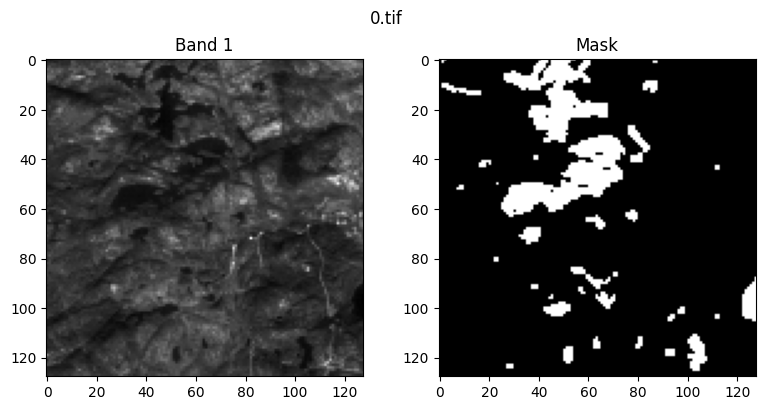

In [29]:
print("✅ Matched samples:", len(image_paths))
img, msk = preprocess_image_mask(image_paths[0], label_paths[0])
visualize_image_and_mask(img, msk, title=os.path.basename(image_paths[0]))

In [30]:
# Check all masks once
empty_masks = 0
for img_path, lbl_path in zip(image_paths, label_paths):
    _, mask = preprocess_image_mask(img_path, lbl_path)
    if np.all(mask == 0):
        empty_masks += 1

rprint(f"[bold red]❗ Total empty masks (all 0): {empty_masks} / {len(label_paths)}[/bold red]")

🧪 0.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 1.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 10.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 100.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 101.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 102.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 103.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 104.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 105.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 106.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 107.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 108.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 109.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 11.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 110.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 111.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 112.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 113.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 114.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 115.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 116.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 117.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 118.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 119.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 12.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 120.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 121.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 122.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 123.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 124.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 125.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 126.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 127.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 128.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 129.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 13.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 130.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 131.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 132.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 133.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 134.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 135.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 136.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 137.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 138.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 139.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 14.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 140.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 141.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 142.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 143.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 144.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 145.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 146.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 147.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 148.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 149.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 15.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 150.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 151.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 152.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 153.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 154.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 155.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 156.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 157.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 158.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 159.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 16.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 160.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 161.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 162.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 163.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 164.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 165.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 166.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 167.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 168.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 169.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 17.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 170.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 171.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 172.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 173.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 174.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 175.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 176.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 177.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 178.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 179.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 18.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 180.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 181.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 182.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 183.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 184.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 185.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 186.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 187.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 188.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 189.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 19.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 190.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 191.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 192.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 193.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 194.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 195.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 196.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 197.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 198.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 199.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 2.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 20.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 200.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 201.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 202.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 203.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 204.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 205.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 206.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 207.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 208.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 209.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 21.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 210.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 211.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 212.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 213.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 214.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 215.png → Final shape: (9, 128, 128), Mask unique: [1.]

🧪 216.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 217.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 218.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 219.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 22.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 220.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 221.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 222.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 223.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 224.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 225.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 226.png → Final shape: (9, 128, 128), Mask unique: [1.]

🧪 227.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 228.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 229.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 23.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 230.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 231.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 232.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 233.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 234.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 235.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 236.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 237.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 238.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 239.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 24.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 240.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 241.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 242.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 243.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 244.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 245.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 246.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 247.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 248.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 249.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 25.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 250.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 251.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 252.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 253.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 254.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 255.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 256.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 257.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 258.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 259.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 26.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 260.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 261.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 262.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 263.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 264.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 265.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 266.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 267.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 268.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 269.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 27.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 270.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 271.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 272.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 273.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 274.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 275.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 276.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 277.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 278.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 279.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 28.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 280.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 281.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 282.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 283.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 284.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 285.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 286.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 287.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 288.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 289.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 29.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 290.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 291.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 292.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 293.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 294.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 295.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 296.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 297.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 298.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 299.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 3.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 30.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 300.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 301.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 302.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 303.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 304.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 305.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 31.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 32.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 33.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 34.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 35.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 36.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 37.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 38.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 39.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 4.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 40.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 41.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 42.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 43.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 44.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 45.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 46.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 47.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 48.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 49.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 5.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 50.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 51.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 52.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 53.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 54.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 55.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 56.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 57.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 58.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 59.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 6.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 60.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 61.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 62.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 63.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 64.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 65.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 66.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 67.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 68.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 69.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 7.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 70.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 71.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 72.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 73.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 74.png → Final shape: (9, 128, 128), Mask unique: [1.]

🧪 75.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 76.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 77.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 78.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 79.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 8.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 80.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 81.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 82.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 83.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 84.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 85.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 86.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 87.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 88.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 89.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 9.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 90.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 91.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 92.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 93.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 94.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 95.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 96.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 97.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 98.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 99.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

❗ Total empty masks (all 0): 45 / 306

In [31]:
def print_band_statistics(image):
    """
    Print basic statistics of each band for debugging.
    """
    for i in range(image.shape[0]):
        rprint(f"[cyan]Band {i+1} → mean={image[i].mean():.4f}, std={image[i].std():.4f}[/cyan]")

In [32]:
def save_to_npz(images, masks, save_path):
    """
    Save dataset arrays to NPZ format (creates directory if not exists).
    """
    save_dir = os.path.dirname(save_path)
    # Handle case when only filename is provided (no directory)
    if save_dir != "" and not os.path.exists(save_dir):
        os.makedirs(save_dir, exist_ok=True)

    np.savez_compressed(save_path, images=images, masks=masks)
    rprint(f"[bold green]💾 Dataset saved to {os.path.abspath(save_path)}[/bold green]")

In [36]:
from tqdm import tqdm

def preprocess_all_dataset(image_paths, label_paths, save_path="dataset_9ch.npz"):
    """
    Preprocess all images and masks using new 9-channel approach.
    Saves result as NPZ file.
    """
    all_images, all_masks = [], []

    console.rule("[bold blue]🧪 Starting Full Dataset Preprocessing (9-channel)[/bold blue]")

    for idx, (img_path, msk_path) in enumerate(tqdm(zip(image_paths, label_paths), total=len(image_paths))):
        img, msk = preprocess_image_mask(img_path, msk_path)
        all_images.append(img)
        all_masks.append(msk)

        if idx < 3:  # Show stats for first 3 samples only
            rprint(f"[bold cyan]🔎 Sample {idx+1} - {os.path.basename(img_path)}[/bold cyan]")
            print_band_statistics(img)

    all_images = np.stack(all_images)  # (N, 9, 128, 128)
    all_masks = np.stack(all_masks)    # (N, 1, 128, 128)

    save_to_npz(all_images, all_masks, save_path)
    console.rule("[bold green]✅ Preprocessing Complete[/bold green]")

    return all_images, all_masks

In [37]:
all_images, all_masks = preprocess_all_dataset(image_paths, label_paths, save_path="dataset_9ch.npz")
print(all_images.shape, all_masks.shape)

─────────────────────────────── 🧪 Starting Full Dataset Preprocessing (9-channel) ────────────────────────────────

  0%|          | 0/306 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning:

Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.



🧪 0.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🔎 Sample 1 - 0.tif

Band 1 → mean=-0.0000, std=1.0000

Band 2 → mean=0.0000, std=1.0000

Band 3 → mean=0.0000, std=1.0000

Band 4 → mean=0.0000, std=1.0000

Band 5 → mean=0.0000, std=1.0000

Band 6 → mean=-0.0000, std=1.0000

Band 7 → mean=0.0000, std=1.0000

Band 8 → mean=-0.0000, std=1.0000

Band 9 → mean=0.0000, std=1.0000

🧪 1.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🔎 Sample 2 - 1.tif

Band 1 → mean=0.0000, std=1.0000

Band 2 → mean=0.0000, std=1.0000

Band 3 → mean=-0.0000, std=1.0000

Band 4 → mean=-0.0000, std=1.0000

Band 5 → mean=0.0000, std=1.0000

Band 6 → mean=-0.0000, std=1.0000

Band 7 → mean=0.0000, std=1.0000

Band 8 → mean=0.0000, std=1.0000

Band 9 → mean=0.0000, std=1.0000

🧪 10.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🔎 Sample 3 - 10.tif

Band 1 → mean=0.0000, std=1.0000

Band 2 → mean=0.0000, std=1.0000

Band 3 → mean=-0.0000, std=1.0000

Band 4 → mean=0.0000, std=1.0000

Band 5 → mean=0.0000, std=1.0000

Band 6 → mean=-0.0000, std=1.0000

Band 7 → mean=-0.0000, std=1.0000

Band 8 → mean=0.0000, std=1.0000

Band 9 → mean=0.0000, std=1.0000

  1%|          | 3/306 [00:00<00:12, 24.97it/s]

🧪 100.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 101.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 102.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 103.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 104.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

  3%|▎         | 8/306 [00:00<00:08, 36.98it/s]

🧪 105.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 106.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 107.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 108.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 109.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

  4%|▍         | 13/306 [00:00<00:07, 39.14it/s]

🧪 11.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 110.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 111.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 112.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 113.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 114.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

  6%|▌         | 19/306 [00:00<00:06, 44.19it/s]

🧪 115.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 116.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 117.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 118.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 119.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

  8%|▊         | 24/306 [00:00<00:06, 45.87it/s]

🧪 12.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 120.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 121.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 122.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 123.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

  9%|▉         | 29/306 [00:00<00:05, 46.32it/s]

🧪 124.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 125.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 126.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 127.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 128.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 129.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 11%|█▏        | 35/306 [00:00<00:05, 46.27it/s]

🧪 13.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 130.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 131.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 132.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 133.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 134.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 13%|█▎        | 41/306 [00:00<00:05, 48.14it/s]

🧪 135.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 136.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 137.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 138.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 139.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 14.png → Final shape: (9, 128, 128), Mask unique: [0.]

 15%|█▌        | 47/306 [00:01<00:05, 49.40it/s]

🧪 140.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 141.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 142.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 143.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 144.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 145.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 17%|█▋        | 53/306 [00:01<00:04, 51.88it/s]

🧪 146.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 147.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 148.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 149.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 15.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 150.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 19%|█▉        | 59/306 [00:01<00:04, 53.27it/s]

🧪 151.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 152.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 153.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 154.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 155.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 156.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 21%|██        | 65/306 [00:01<00:04, 48.85it/s]

🧪 157.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 158.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 159.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 16.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 160.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 23%|██▎       | 70/306 [00:01<00:05, 47.06it/s]

🧪 161.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 162.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 163.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 164.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 165.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 25%|██▍       | 75/306 [00:01<00:04, 47.10it/s]

🧪 166.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 167.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 168.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 169.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 17.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 26%|██▌       | 80/306 [00:01<00:04, 46.83it/s]

🧪 170.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 171.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 172.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 173.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 174.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 175.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 28%|██▊       | 86/306 [00:01<00:04, 47.80it/s]

🧪 176.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 177.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 178.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 179.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 18.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 180.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 30%|███       | 92/306 [00:01<00:04, 48.63it/s]

🧪 181.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 182.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 183.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 184.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 185.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 32%|███▏      | 97/306 [00:02<00:04, 47.04it/s]

🧪 186.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 187.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 188.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 189.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 19.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 33%|███▎      | 102/306 [00:02<00:04, 46.82it/s]

🧪 190.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 191.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 192.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 193.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 194.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 35%|███▍      | 107/306 [00:02<00:04, 45.66it/s]

🧪 195.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 196.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 197.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 198.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 199.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 37%|███▋      | 112/306 [00:02<00:04, 46.02it/s]

🧪 2.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 20.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 200.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 201.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 202.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 38%|███▊      | 117/306 [00:02<00:04, 45.16it/s]

🧪 203.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 204.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 205.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 206.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 207.png → Final shape: (9, 128, 128), Mask unique: [0.]

 40%|███▉      | 122/306 [00:02<00:04, 44.82it/s]

🧪 208.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 209.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 21.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 210.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 211.png → Final shape: (9, 128, 128), Mask unique: [0.]

 42%|████▏     | 127/306 [00:02<00:04, 44.42it/s]

🧪 212.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 213.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 214.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 215.png → Final shape: (9, 128, 128), Mask unique: [1.]

🧪 216.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 43%|████▎     | 132/306 [00:02<00:04, 43.38it/s]

🧪 217.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 218.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 219.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 22.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 220.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 221.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 45%|████▌     | 138/306 [00:02<00:03, 45.74it/s]

🧪 222.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 223.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 224.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 225.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 226.png → Final shape: (9, 128, 128), Mask unique: [1.]

 47%|████▋     | 143/306 [00:03<00:03, 44.59it/s]

🧪 227.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 228.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 229.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 23.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 230.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 48%|████▊     | 148/306 [00:03<00:03, 44.89it/s]

🧪 231.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 232.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 233.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 234.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 235.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 50%|█████     | 153/306 [00:03<00:03, 44.37it/s]

🧪 236.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 237.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 238.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 239.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 24.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 52%|█████▏    | 158/306 [00:03<00:03, 44.29it/s]

🧪 240.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 241.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 242.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 243.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 244.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 53%|█████▎    | 163/306 [00:03<00:03, 43.25it/s]

🧪 245.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 246.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 247.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 248.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 249.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 55%|█████▍    | 168/306 [00:03<00:03, 43.50it/s]

🧪 25.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 250.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 251.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 252.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 253.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 57%|█████▋    | 173/306 [00:03<00:02, 44.60it/s]

🧪 254.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 255.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 256.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 257.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 258.png → Final shape: (9, 128, 128), Mask unique: [0.]

 58%|█████▊    | 178/306 [00:03<00:03, 40.09it/s]

🧪 259.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 26.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 260.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 261.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 262.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 60%|█████▉    | 183/306 [00:04<00:02, 41.79it/s]

🧪 263.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 264.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 265.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 266.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 267.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 61%|██████▏   | 188/306 [00:04<00:02, 42.47it/s]

🧪 268.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 269.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 27.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 270.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 271.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 272.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 63%|██████▎   | 194/306 [00:04<00:02, 45.17it/s]

🧪 273.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 274.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 275.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 276.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 277.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 65%|██████▌   | 199/306 [00:04<00:02, 45.46it/s]

🧪 278.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 279.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 28.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 280.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 281.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 67%|██████▋   | 204/306 [00:04<00:02, 45.13it/s]

🧪 282.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 283.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 284.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 285.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 286.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 68%|██████▊   | 209/306 [00:04<00:02, 45.42it/s]

🧪 287.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 288.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 289.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 29.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 290.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 70%|██████▉   | 214/306 [00:04<00:02, 44.23it/s]

🧪 291.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 292.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 293.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 294.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 295.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 72%|███████▏  | 219/306 [00:04<00:01, 45.49it/s]

🧪 296.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 297.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 298.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 299.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 3.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 73%|███████▎  | 224/306 [00:04<00:01, 45.03it/s]

🧪 30.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 300.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 301.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 302.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 303.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 75%|███████▍  | 229/306 [00:05<00:01, 45.88it/s]

🧪 304.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 305.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 31.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 32.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 33.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 76%|███████▋  | 234/306 [00:05<00:01, 45.99it/s]

🧪 34.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 35.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 36.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 37.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 38.png → Final shape: (9, 128, 128), Mask unique: [0.]

 78%|███████▊  | 239/306 [00:05<00:01, 46.51it/s]

🧪 39.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 4.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 40.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 41.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 42.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 80%|███████▉  | 244/306 [00:05<00:01, 45.89it/s]

🧪 43.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 44.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 45.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 46.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 47.png → Final shape: (9, 128, 128), Mask unique: [0.]

 81%|████████▏ | 249/306 [00:05<00:01, 44.32it/s]

🧪 48.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 49.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 5.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 50.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 51.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 52.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 83%|████████▎ | 255/306 [00:05<00:01, 46.96it/s]

🧪 53.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 54.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 55.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 56.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 57.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 58.png → Final shape: (9, 128, 128), Mask unique: [0.]

 85%|████████▌ | 261/306 [00:05<00:00, 48.60it/s]

🧪 59.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 6.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 60.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 61.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 62.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 63.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 87%|████████▋ | 267/306 [00:05<00:00, 50.78it/s]

🧪 64.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 65.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 66.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 67.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 68.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 69.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 89%|████████▉ | 273/306 [00:05<00:00, 51.73it/s]

🧪 7.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 70.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 71.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 72.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 73.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 74.png → Final shape: (9, 128, 128), Mask unique: [1.]

 91%|█████████ | 279/306 [00:06<00:00, 53.60it/s]

🧪 75.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 76.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 77.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 78.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 79.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 8.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 93%|█████████▎| 285/306 [00:06<00:00, 52.82it/s]

🧪 80.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 81.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 82.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 83.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 84.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 85.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 86.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 95%|█████████▌| 292/306 [00:06<00:00, 55.49it/s]

🧪 87.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 88.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 89.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 9.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 90.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 91.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 97%|█████████▋| 298/306 [00:06<00:00, 56.57it/s]

🧪 92.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 93.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 94.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 95.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 96.png → Final shape: (9, 128, 128), Mask unique: [0.]

🧪 97.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

 99%|█████████▉| 304/306 [00:06<00:00, 56.77it/s]

🧪 98.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

🧪 99.png → Final shape: (9, 128, 128), Mask unique: [0. 1.]

100%|██████████| 306/306 [00:06<00:00, 46.96it/s]


💾 Dataset saved to /content/drive/MyDrive/Cellula/02_Project 2/dataset_9ch.npz

──────────────────────────────────────────── ✅ Preprocessing Complete ────────────────────────────────────────────

(306, 9, 128, 128) (306, 1, 128, 128)


# **3. Dataset Loader & Split Engine**

## **3.1 Step 1: Load and Split .npz Data**

In [38]:
def load_npz(npz_path):
    """
    Load preprocessed dataset saved in NPZ format.
    Returns numpy arrays: (images, masks)
    """
    data = np.load(npz_path)
    images, masks = data["images"], data["masks"]
    rprint(f"[bold green]✅ Loaded {len(images)} samples from {npz_path}[/bold green]")
    rprint(f"[bold yellow]Image shape:[/bold yellow] {images.shape}, [bold yellow]Mask shape:[/bold yellow] {masks.shape}")
    return images, masks

## **3.2 Step 2: Build PyTorch Dataset Class**

This custom PyTorch dataset is designed to handle satellite images and their corresponding water segmentation masks. It prepares data in a format suitable for training deep learning models.

- Inputs
  - `images`: A list or NumPy array of multispectral satellite images, each with 12 channels (bands).
  - `masks`: A list or array of binary water masks corresponding to each image.
- Purpose
 - Converts each image and mask to PyTorch tensors.
 - Ensures compatibility with DataLoader for batching and shuffling.
 - Enables easy integration into PyTorch training loops.
- Output
  - A tuple of (`image`, `mask`) for each sample, both as float32 tensors.

In [39]:
class WaterSegmentationDataset(Dataset):
    """
    Custom PyTorch Dataset for loading satellite images and their corresponding binary water masks.

    Args:
        images (List or np.ndarray): A list or array of normalized multispectral images.
                                     Each image should have shape (12, H, W), where 12 is the number of spectral bands.
        masks (List or np.ndarray): A list or array of binary masks corresponding to each image.
                                    Each mask should have shape (1, H, W), where 1 indicates a single binary channel.

    Returns:
        image (torch.Tensor): A float32 tensor of the image, shape (12, H, W).
        mask (torch.Tensor): A float32 tensor of the mask, shape (1, H, W).
    """

    def __init__(self, images, masks):
        # Store references to the images and masks
        self.images = images
        self.masks = masks
        assert len(images) == len(masks), "Images and masks count mismatch!"

    def __len__(self):
        # Return the number of samples in the dataset
        return len(self.images)

    def __getitem__(self, idx):
        """
        Load a single sample from the dataset at index `idx`.

        Returns:
            (image, mask): A tuple of tensors ready for training.
        """
        # Convert the image and mask at index `idx` to PyTorch tensors
        image = torch.tensor(self.images[idx], dtype=torch.float32)
        mask = torch.tensor(self.masks[idx], dtype=torch.float32)
        return image, mask


## **3.3 Step 3: Split Dataset + Build Loaders**

In [128]:
def prepare_dataloaders(npz_path, val_ratio=0.2, batch_size=8, seed=42):
    """
    Split dataset and create train/val dataloaders.
    """
    np.random.seed(seed)
    images, masks = load_npz(npz_path)

    # Shuffle indices
    indices = np.arange(len(images))
    np.random.shuffle(indices)

    split_idx = int(len(images) * (1 - val_ratio))
    train_idx, val_idx = indices[:split_idx], indices[split_idx:]

    train_dataset = WaterSegmentationDataset(images[train_idx], masks[train_idx])
    val_dataset = WaterSegmentationDataset(images[val_idx], masks[val_idx])

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    rprint(f"[bold blue]Train samples:[/bold blue] {len(train_dataset)}")
    rprint(f"[bold blue]Val samples:[/bold blue] {len(val_dataset)}")

    return train_loader, val_loader

In [129]:
train_loader, val_loader = prepare_dataloaders("dataset_9ch.npz", val_ratio=0.2, batch_size=8)

✅ Loaded 306 samples from dataset_9ch.npz

Image shape: (306, 9, 128, 128), Mask shape: (306, 1, 128, 128)

Train samples: 244

Val samples: 62

In [130]:
def visualize_random_batch(dataloader):
    """
    Visualize one random batch from dataloader (uses RGB channels 1,2,3).
    """
    images, masks = next(iter(dataloader))
    idx = random.randint(0, len(images)-1)

    img = images[idx].numpy()
    mask = masks[idx].squeeze().numpy()

    # Pick RGB channels (Blue, Green, Red)
    rgb = np.stack([img[3], img[2], img[1]], axis=-1)  # (H, W, 3)
    # Normalize for visualization
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-8)

    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(rgb)
    axs[0].set_title("RGB Composite")
    axs[0].axis("off")
    axs[1].imshow(mask, cmap="gray")
    axs[1].set_title("Mask")
    axs[1].axis("off")
    plt.suptitle("Random Batch Sample", fontsize=14)
    plt.tight_layout()
    plt.show()

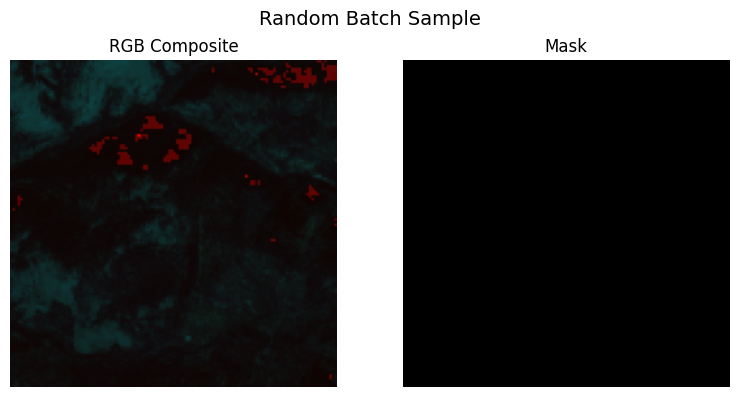

In [131]:
visualize_random_batch(train_loader)

# **4. Automated Model Search with Optuna + Tracking**

## **4.1 Define multiple model architectures**

### 4.1.1 UNet

The U-Net model is a powerful convolutional architecture designed for pixel-wise segmentation. It follows an encoder–decoder structure with skip connections.
  - Encoder: Extracts hierarchical features using convolution + pooling.
  - Bottleneck: The deepest part of the network that captures abstract context.
  - Decoder: Upsamples features and fuses them with encoder features (via skip connections) to reconstruct pixel-level output.
  - Final Output: A 1-channel probability map predicting the presence of water per pixel.

In [132]:
import torch
import torch.nn as nn
import torchvision

In [133]:
def modify_first_conv(conv, in_channels):
    new_conv = nn.Conv2d(
        in_channels=in_channels,
        out_channels=conv.out_channels,
        kernel_size=conv.kernel_size,
        stride=conv.stride,
        padding=conv.padding,
        bias=(conv.bias is not None)
    )
    with torch.no_grad():
        if in_channels >= 3:
            new_conv.weight[:, :3] = conv.weight
            for i in range(3, in_channels):
                new_conv.weight[:, i] = conv.weight.mean(dim=1)
        else:
            avg_weight = conv.weight.mean(dim=1, keepdim=True)
            new_conv.weight = nn.Parameter(avg_weight.repeat(1, in_channels, 1, 1))
        if conv.bias is not None:
            new_conv.bias = conv.bias
    return new_conv

In [134]:
def set_trainable_layers(model, unfreeze_layers=0):
    """
    unfreeze_layers:
        - 0   → Freeze all backbone layers
        - -1  → Unfreeze all
        - >0  → Unfreeze last N layers (ResNet or MobileNet blocks)
    """
    # Freeze everything by default
    for param in model.backbone.parameters():
        param.requires_grad = False

    # Unfreeze everything if -1
    if unfreeze_layers == -1:
        for param in model.backbone.parameters():
            param.requires_grad = True
        return

    # Handle ResNet backbone
    if hasattr(model.backbone, "layer4"):
        layers = [model.backbone.layer4, model.backbone.layer3,
                  model.backbone.layer2, model.backbone.layer1]
        for layer in layers[:unfreeze_layers]:
            for param in layer.parameters():
                param.requires_grad = True

    # Handle MobileNet backbone
    elif hasattr(model.backbone, "blocks"):
        for param in model.backbone.blocks[-unfreeze_layers:].parameters():
            param.requires_grad = True

In [135]:
def model_summary(model, name):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen_params = total_params - trainable_params
    size_mb = total_params * 4 / (1024 ** 2)
    print(f"\n📌 [Model: {name}]")
    print(f"   • Total Parameters   : {total_params:,}")
    print(f"   • Trainable Params   : {trainable_params:,}")
    print(f"   • Frozen Params      : {frozen_params:,}")
    print(f"   • Model Size (float32): {size_mb:.2f} MB")

In [136]:
def build_deeplabv3_resnet50(in_channels=9, unfreeze_layers=0):
    model = torchvision.models.segmentation.deeplabv3_resnet50(weights="DEFAULT")
    model.backbone.conv1 = modify_first_conv(model.backbone.conv1, in_channels)
    model.classifier[4] = nn.Conv2d(256, 1, kernel_size=1)
    set_trainable_layers(model, unfreeze_layers)
    model_summary(model, f"DeepLabv3_ResNet50 (unfreeze {unfreeze_layers})")
    return model

In [137]:
def build_fcn_resnet50(in_channels=9, unfreeze_layers=0):
    model = torchvision.models.segmentation.fcn_resnet50(weights="DEFAULT")
    model.backbone.conv1 = modify_first_conv(model.backbone.conv1, in_channels)
    model.classifier[4] = nn.Conv2d(512, 1, kernel_size=1)
    set_trainable_layers(model, unfreeze_layers)
    model_summary(model, f"FCN_ResNet50 (unfreeze {unfreeze_layers})")
    return model

In [138]:
def build_lraspp_mobilenetv3(in_channels=9, unfreeze_layers=0):
    model = torchvision.models.segmentation.lraspp_mobilenet_v3_large(weights="DEFAULT")

    # --- Find first Conv2d dynamically ---
    for name, module in model.backbone.named_modules():
        if isinstance(module, nn.Conv2d):
            first_conv_name = name
            first_conv = module
            break

    # Replace it with our modified conv
    new_conv = modify_first_conv(first_conv, in_channels)
    parent_module = model.backbone
    for part in first_conv_name.split('.')[:-1]:
        parent_module = getattr(parent_module, part)
    setattr(parent_module, first_conv_name.split('.')[-1], new_conv)

    # --- Replace classifier heads for binary segmentation ---
    model.classifier.low_classifier = nn.Conv2d(40, 1, kernel_size=1)
    model.classifier.high_classifier = nn.Conv2d(128, 1, kernel_size=1)

    set_trainable_layers(model, unfreeze_layers)
    model_summary(model, f"LRASPP_MobileNetV3 (unfreeze {unfreeze_layers})")
    return model

In [139]:
def build_all_models(in_channels=9, unfreeze_layers=-1):
    return {
        "DeepLabv3_ResNet50": build_deeplabv3_resnet50(in_channels, unfreeze_layers),
        "FCN_ResNet50": build_fcn_resnet50(in_channels, unfreeze_layers),
        "LRASPP_MobileNetV3": build_lraspp_mobilenetv3(in_channels, unfreeze_layers)
    }

In [140]:
models = build_all_models(in_channels=9, unfreeze_layers=15)


📌 [Model: DeepLabv3_ResNet50 (unfreeze 15)]
   • Total Parameters   : 42,017,750
   • Trainable Params   : 41,989,398
   • Frozen Params      : 28,352
   • Model Size (float32): 160.28 MB

📌 [Model: FCN_ResNet50 (unfreeze 15)]
   • Total Parameters   : 35,330,774
   • Trainable Params   : 35,302,422
   • Frozen Params      : 28,352
   • Model Size (float32): 134.78 MB

📌 [Model: LRASPP_MobileNetV3 (unfreeze 15)]
   • Total Parameters   : 3,219,002
   • Trainable Params   : 246,186
   • Frozen Params      : 2,972,816
   • Model Size (float32): 12.28 MB


In [141]:
def analyze_and_save_model(model, name="model", out_dir="project/outputs/models"):
    print(f"\n🔍 Analyzing model: {name}")
    start_time = time.time()

    model.to(device)
    model.eval()

    # Count total and trainable parameters
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"📦 Total parameters: {total_params:,}")
    print(f"🎯 Trainable parameters: {trainable_params:,}")

    # Save model weights
    os.makedirs(out_dir, exist_ok=True)
    save_path = os.path.join(out_dir, f"{name}.pt")
    torch.save(model.state_dict(), save_path)

    elapsed = time.time() - start_time
    print(f"✅ [Saved] {name} in {elapsed:.2f} seconds ➜ {save_path}")

In [142]:
# === Analyze & Save Each Model ===
for model_name, model in models.items():
    analyze_and_save_model(model, name=model_name, out_dir="project/outputs/models")


🔍 Analyzing model: DeepLabv3_ResNet50
📦 Total parameters: 42,017,750
🎯 Trainable parameters: 41,989,398
✅ [Saved] DeepLabv3_ResNet50 in 0.57 seconds ➜ project/outputs/models/DeepLabv3_ResNet50.pt

🔍 Analyzing model: FCN_ResNet50
📦 Total parameters: 35,330,774
🎯 Trainable parameters: 35,302,422
✅ [Saved] FCN_ResNet50 in 0.49 seconds ➜ project/outputs/models/FCN_ResNet50.pt

🔍 Analyzing model: LRASPP_MobileNetV3
📦 Total parameters: 3,219,002
🎯 Trainable parameters: 246,186
✅ [Saved] LRASPP_MobileNetV3 in 0.11 seconds ➜ project/outputs/models/LRASPP_MobileNetV3.pt


In [143]:
# Dummy input (Batch=4, Channels=9, H=128, W=128)
x = torch.randn(4, 9, 128, 128)

# Put models on device (CPU/GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Test output shapes
for name, model in models.items():
    model = model.to(device)
    model.eval()
    with torch.no_grad():
        out = model(x.to(device))["out"]
    print(f"{name} output shape: {out.shape}")

DeepLabv3_ResNet50 output shape: torch.Size([4, 1, 128, 128])
FCN_ResNet50 output shape: torch.Size([4, 1, 128, 128])
LRASPP_MobileNetV3 output shape: torch.Size([4, 1, 128, 128])


In [144]:
def visualize_model_architecture(model,
                                 input_shape=(1, 9, 128, 128),
                                 model_name="model",
                                 out_dir="project/outputs/models",
                                 show=True,
                                 save=True):
    """
    Visualizes the architecture of a PyTorch model using torchviz and prints model stats.

    Args:
        model (torch.nn.Module): PyTorch model to visualize.
        input_shape (tuple): Shape of the dummy input tensor.
        model_name (str): Base filename to save diagram.
        out_dir (str): Directory to save the diagram.
        show (bool): Display image inline.
        save (bool): Save the image to disk.

    Returns:
        dict: Model stats (total_params, trainable_params, frozen_params, size_MB)
    """
    model.eval()
    os.makedirs(out_dir, exist_ok=True)

    # --- Dummy input ---
    dummy_input = torch.randn(input_shape)

    # --- Forward pass ---
    output = model(dummy_input)
    if isinstance(output, dict) and "out" in output:
        output = output["out"]

    # --- Compute model stats ---
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen_params = total_params - trainable_params
    size_mb = total_params * 4 / (1024 ** 2)  # float32 = 4 bytes

    # --- Print summary ---
    print(f"\n📌 [Model: {model_name}]")
    print(f"   • Total Parameters   : {total_params:,}")
    print(f"   • Trainable Params   : {trainable_params:,}")
    print(f"   • Frozen Params      : {frozen_params:,}")
    print(f"   • Model Size (float32): {size_mb:.2f} MB")

    # --- Generate diagram ---
    dot = make_dot(output, params=dict(model.named_parameters()))

    filename = os.path.join(out_dir, f"{model_name}_architecture")
    if save:
        dot.render(filename, format="png")
        print(f"[✓] Saved architecture diagram: {filename}.png")

    if show:
        display(Image(filename=f"{filename}.png"))

    return {
        "total_params": total_params,
        "trainable_params": trainable_params,
        "frozen_params": frozen_params,
        "model_size_mb": size_mb
    }

## **4.2 	Define objective function for Optuna**

In [145]:
try:
  import optuna
except:
  !pip install optuna
  import optuna
from tqdm import tqdm
import torch.nn.functional as F

In [146]:
def dice_loss(pred, target, smooth=1.):
    pred = pred.contiguous()
    target = target.contiguous()
    intersection = (pred * target).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
    loss = 1 - ((2. * intersection + smooth) / (union + smooth))
    return loss.mean()

In [147]:
def combo_loss(pred, target):
    bce = F.binary_cross_entropy_with_logits(pred, target)
    pred_sigmoid = torch.sigmoid(pred)
    dsc = dice_loss(pred_sigmoid, target)
    return 0.5 * bce + 0.5 * dsc

In [148]:
def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    running_loss = 0
    for x, y in loader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        out = model(x)
        if isinstance(out, dict) and "out" in out:
            out = out["out"]
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    return running_loss / len(loader)

In [149]:
def evaluate_iou(model, loader, device):
    model.eval()
    ious = []
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            out = model(x)
            if isinstance(out, dict) and "out" in out:
                out = out["out"]
            out = torch.sigmoid(out)
            pred = (out > 0.5).float()
            inter = (pred * y).sum(dim=(2, 3))
            union = (pred + y - pred * y).sum(dim=(2, 3))
            iou = (inter / (union + 1e-7)).mean().item()
            ious.append(iou)
    return sum(ious) / len(ious)

In [150]:
import copy

def get_model_by_name(name, models_dict):
    """
    Return a fresh copy of the selected model.
    Keeps pretrained weights but resets optimizer states.
    """
    return copy.deepcopy(models_dict[name])


In [151]:
def objective(trial):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # --- Choose hyperparameters ---
    model_name = trial.suggest_categorical("model", list(models.keys()))
    lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
    optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "RMSprop"])

    # --- Get model copy ---
    model = get_model_by_name(model_name, models).to(device)

    # --- Optimizer ---
    optimizer = getattr(torch.optim, optimizer_name)(model.parameters(), lr=lr)

    # --- Training ---
    best_iou = 0.0
    for epoch in range(3):  # short training for optuna speed
        print(f"\n📚 Trial {trial.number} | Epoch {epoch+1} | Model: {model_name}")
        loss = train_one_epoch(model, train_loader, optimizer, combo_loss, device)
        iou = evaluate_iou(model, val_loader, device)
        print(f"📉 Loss: {loss:.4f} | 📈 IoU: {iou:.4f}")

        # Report progress
        trial.report(iou, epoch)
        if trial.should_prune():
            raise optuna.TrialPruned()

        best_iou = max(best_iou, iou)

    # --- Save trained model for this trial ---
    os.makedirs("project/outputs/models", exist_ok=True)
    torch.save(model.state_dict(), f"project/outputs/models/{model_name}_trial{trial.number}.pt")

    return best_iou


In [152]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10)

print("Best trial:")
print(study.best_trial.params)


[I 2025-07-23 19:43:01,727] A new study created in memory with name: no-name-824daabf-735d-4ef5-bec1-59743a56f79e
/tmp/ipython-input-151-3228912602.py:6: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.




📚 Trial 0 | Epoch 1 | Model: DeepLabv3_ResNet50
📉 Loss: 0.6798 | 📈 IoU: 0.2653

📚 Trial 0 | Epoch 2 | Model: DeepLabv3_ResNet50
📉 Loss: 0.5911 | 📈 IoU: 0.2931

📚 Trial 0 | Epoch 3 | Model: DeepLabv3_ResNet50
📉 Loss: 0.5462 | 📈 IoU: 0.3167


[I 2025-07-23 19:43:20,700] Trial 0 finished with value: 0.31669534742832184 and parameters: {'model': 'DeepLabv3_ResNet50', 'lr': 1.1489498370566212e-05, 'optimizer': 'RMSprop'}. Best is trial 0 with value: 0.31669534742832184.



📚 Trial 1 | Epoch 1 | Model: DeepLabv3_ResNet50
📉 Loss: 0.5986 | 📈 IoU: 0.3271

📚 Trial 1 | Epoch 2 | Model: DeepLabv3_ResNet50
📉 Loss: 0.4769 | 📈 IoU: 0.3602

📚 Trial 1 | Epoch 3 | Model: DeepLabv3_ResNet50
📉 Loss: 0.4503 | 📈 IoU: 0.4071


[I 2025-07-23 19:43:41,504] Trial 1 finished with value: 0.40710820630192757 and parameters: {'model': 'DeepLabv3_ResNet50', 'lr': 8.316039397911922e-05, 'optimizer': 'RMSprop'}. Best is trial 1 with value: 0.40710820630192757.



📚 Trial 2 | Epoch 1 | Model: LRASPP_MobileNetV3
📉 Loss: 0.6887 | 📈 IoU: 0.1469

📚 Trial 2 | Epoch 2 | Model: LRASPP_MobileNetV3
📉 Loss: 0.6460 | 📈 IoU: 0.1324

📚 Trial 2 | Epoch 3 | Model: LRASPP_MobileNetV3


[I 2025-07-23 19:43:44,514] Trial 2 finished with value: 0.14914209116250277 and parameters: {'model': 'LRASPP_MobileNetV3', 'lr': 0.00012988885192995195, 'optimizer': 'Adam'}. Best is trial 1 with value: 0.40710820630192757.


📉 Loss: 0.6184 | 📈 IoU: 0.1491

📚 Trial 3 | Epoch 1 | Model: DeepLabv3_ResNet50
📉 Loss: 0.6309 | 📈 IoU: 0.1705

📚 Trial 3 | Epoch 2 | Model: DeepLabv3_ResNet50
📉 Loss: 0.5805 | 📈 IoU: 0.2364

📚 Trial 3 | Epoch 3 | Model: DeepLabv3_ResNet50
📉 Loss: 0.5614 | 📈 IoU: 0.2613


[I 2025-07-23 19:44:03,321] Trial 3 finished with value: 0.2612589802592993 and parameters: {'model': 'DeepLabv3_ResNet50', 'lr': 0.0006783336496292375, 'optimizer': 'RMSprop'}. Best is trial 1 with value: 0.40710820630192757.



📚 Trial 4 | Epoch 1 | Model: FCN_ResNet50
📉 Loss: 0.6150 | 📈 IoU: 0.2931

📚 Trial 4 | Epoch 2 | Model: FCN_ResNet50
📉 Loss: 0.5029 | 📈 IoU: 0.3354

📚 Trial 4 | Epoch 3 | Model: FCN_ResNet50
📉 Loss: 0.4827 | 📈 IoU: 0.3622


[I 2025-07-23 19:44:19,715] Trial 4 finished with value: 0.36222177371382713 and parameters: {'model': 'FCN_ResNet50', 'lr': 4.175250218490394e-05, 'optimizer': 'Adam'}. Best is trial 1 with value: 0.40710820630192757.



📚 Trial 5 | Epoch 1 | Model: DeepLabv3_ResNet50
📉 Loss: 0.6180 | 📈 IoU: 0.2783

📚 Trial 5 | Epoch 2 | Model: DeepLabv3_ResNet50
📉 Loss: 0.5531 | 📈 IoU: 0.2976

📚 Trial 5 | Epoch 3 | Model: DeepLabv3_ResNet50
📉 Loss: 0.4883 | 📈 IoU: 0.3243


[I 2025-07-23 19:44:38,152] Trial 5 finished with value: 0.3243338093161583 and parameters: {'model': 'DeepLabv3_ResNet50', 'lr': 0.00048022272395324515, 'optimizer': 'Adam'}. Best is trial 1 with value: 0.40710820630192757.



📚 Trial 6 | Epoch 1 | Model: FCN_ResNet50
📉 Loss: 0.6164 | 📈 IoU: 0.3052

📚 Trial 6 | Epoch 2 | Model: FCN_ResNet50
📉 Loss: 0.4979 | 📈 IoU: 0.3557

📚 Trial 6 | Epoch 3 | Model: FCN_ResNet50
📉 Loss: 0.4384 | 📈 IoU: 0.3893


[I 2025-07-23 19:44:51,633] Trial 6 finished with value: 0.3893277421593666 and parameters: {'model': 'FCN_ResNet50', 'lr': 8.052482592587441e-05, 'optimizer': 'Adam'}. Best is trial 1 with value: 0.40710820630192757.



📚 Trial 7 | Epoch 1 | Model: LRASPP_MobileNetV3


[I 2025-07-23 19:44:52,268] Trial 7 pruned. 


📉 Loss: 0.5997 | 📈 IoU: 0.1957

📚 Trial 8 | Epoch 1 | Model: DeepLabv3_ResNet50
📉 Loss: 0.6236 | 📈 IoU: 0.3347

📚 Trial 8 | Epoch 2 | Model: DeepLabv3_ResNet50
📉 Loss: 0.4889 | 📈 IoU: 0.3099

📚 Trial 8 | Epoch 3 | Model: DeepLabv3_ResNet50
📉 Loss: 0.4553 | 📈 IoU: 0.3631


[I 2025-07-23 19:45:11,498] Trial 8 finished with value: 0.3630682397633791 and parameters: {'model': 'DeepLabv3_ResNet50', 'lr': 0.00023980784090746964, 'optimizer': 'Adam'}. Best is trial 1 with value: 0.40710820630192757.



📚 Trial 9 | Epoch 1 | Model: DeepLabv3_ResNet50


[I 2025-07-23 19:45:18,031] Trial 9 pruned. 


📉 Loss: 0.7150 | 📈 IoU: 0.2678
Best trial:
{'model': 'DeepLabv3_ResNet50', 'lr': 8.316039397911922e-05, 'optimizer': 'RMSprop'}


In [153]:
model = get_model_by_name("DeepLabv3_ResNet50", models).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

for epoch in range(3):
    print(f"\nManual Run | Epoch {epoch+1}")
    loss = train_one_epoch(model, train_loader, optimizer, combo_loss, device)
    iou = evaluate_iou(model, val_loader, device)
    print(f"📉 Loss: {loss:.4f} | 📈 IoU: {iou:.4f}")



Manual Run | Epoch 1
📉 Loss: 0.6159 | 📈 IoU: 0.2142

Manual Run | Epoch 2
📉 Loss: 0.5604 | 📈 IoU: 0.2719

Manual Run | Epoch 3
📉 Loss: 0.5154 | 📈 IoU: 0.3325


In [154]:
def export_study_to_csv(study, output_path="project/outputs/stats/optuna_trials.csv"):
    df = study.trials_dataframe()
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    df.to_csv(output_path, index=False)
    print(f"✅ Trials exported to: {output_path}")

In [155]:
export_study_to_csv(study)

✅ Trials exported to: project/outputs/stats/optuna_trials.csv


In [156]:
import optuna.visualization as vis

def show_optuna_plots(study):
    try:
        vis.plot_optimization_history(study).show()
        vis.plot_param_importances(study).show()
        vis.plot_parallel_coordinate(study).show()
        vis.plot_contour(study).show()
    except Exception as e:
        print("⚠️ Visualization skipped:", e)

In [157]:
print("✅ Best Trial:")
print(study.best_trial.params)

# Save logs
export_study_to_csv(study)

# Plot all results
show_optuna_plots(study)

✅ Best Trial:
{'model': 'DeepLabv3_ResNet50', 'lr': 8.316039397911922e-05, 'optimizer': 'RMSprop'}
✅ Trials exported to: project/outputs/stats/optuna_trials.csv


In [158]:
# Show the project/outputs/stats/optuna_trials.csv
obtuna_trails_csv = pd.read_csv("project/outputs/stats/optuna_trials.csv")
obtuna_trails_csv

,number,value,datetime_start,datetime_complete,duration,params_lr,params_model,params_optimizer,state
0,0,0.316695,2025-07-23 19:43:01.728705,2025-07-23 19:43:20.700350,0 days 00:00:18.971645,0.000011,DeepLabv3_ResNet50,RMSprop,COMPLETE
1,1,0.407108,2025-07-23 19:43:20.703796,2025-07-23 19:43:41.504380,0 days 00:00:20.800584,0.000083,DeepLabv3_ResNet50,RMSprop,COMPLETE
2,2,0.149142,2025-07-23 19:43:41.505322,2025-07-23 19:43:44.514251,0 days 00:00:03.008929,0.000130,LRASPP_MobileNetV3,Adam,COMPLETE
3,3,0.261259,2025-07-23 19:43:44.519558,2025-07-23 19:44:03.321510,0 days 00:00:18.801952,0.000678,DeepLabv3_ResNet50,RMSprop,COMPLETE
4,4,0.362222,2025-07-23 19:44:03.322847,2025-07-23 19:44:19.715205,0 days 00:00:16.392358,0.000042,FCN_ResNet50,Adam,COMPLETE
5,5,0.324334,2025-07-23 19:44:19.718742,2025-07-23 19:44:38.152174,0 days 00:00:18.433432,0.000480,DeepLabv3_ResNet50,Adam,COMPLETE
6,6,0.389328,2025-07-23 19:44:38.153455,2025-07-23 19:44:51.632967,0 days 00:00:13.479512,0.000081,FCN_ResNet50,Adam,COMPLETE
7,7,0.195745,2025-07-23 19:44:51.634272,2025-07-23 19:44:52.268818,0 days 00:00:00.634546,0.001834,LRASPP_MobileNetV3,RMSprop,PRUNED
8,8,0.363068,2025-07-23 19:44:52.269618,2025-07-23 19:45:11.497981,0 days 00:00:19.228363,0.000240,DeepLabv3_ResNet50,Adam,COMPLETE
9,9,0.267799,2025-07-23 19:45:11.501281,2025-07-23 19:45:18.031516,0 days 00:00:06.530235,0.000017,DeepLabv3_ResNet50,Adam,PRUNED


# 5. Training & Evaluation Phase

In [159]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score

def compute_metrics(preds, targets):
    preds_flat = preds.view(-1).cpu().numpy()
    targets_flat = targets.view(-1).cpu().numpy()

    return {
        "Accuracy": accuracy_score(targets_flat, preds_flat),
        "Precision": precision_score(targets_flat, preds_flat, zero_division=0),
        "Recall": recall_score(targets_flat, preds_flat, zero_division=0),
        "F1 Score": f1_score(targets_flat, preds_flat, zero_division=0),
        "IoU": jaccard_score(targets_flat, preds_flat, zero_division=0)
    }

In [160]:
def evaluate_model(model, data_loader, device, name="Evaluation", verbose=True):
    model.eval()
    preds_all, targets_all = [], []

    with torch.no_grad():
        for x, y in data_loader:
            x, y = x.to(device), y.to(device)
            out = model(x)
            if isinstance(out, dict):
                out = out["out"]
            preds_all.append((out > 0.5).float())
            targets_all.append(y)

    preds_all = torch.cat(preds_all)
    targets_all = torch.cat(targets_all)
    metrics = compute_metrics(preds_all, targets_all)

    if verbose:
        print(f"\n📊 {name} Metrics:")
        for k, v in metrics.items():
            print(f"  {k}: {v:.4f}")

    return metrics

In [161]:
def get_model_size(model_path):
    size_mb = os.path.getsize(model_path) / (1024 * 1024)
    return f"{size_mb:.2f} MB"

In [162]:
def measure_inference_time(model, device, input_shape=(1, 9, 128, 128), runs=100):
    model.eval()
    dummy_input = torch.randn(*input_shape).to(device)
    with torch.no_grad():
        # Warm-up
        for _ in range(10):
            _ = model(dummy_input)

        # Time measurement
        start = time.time()
        for _ in range(runs):
            _ = model(dummy_input)
        end = time.time()

    avg_time_ms = ((end - start) / runs) * 1000
    return f"{avg_time_ms:.2f} ms"

In [163]:
def train_model_final(model, train_loader, val_loader, device,
                      epochs=60, lr=1e-3, optimizer_class=torch.optim.Adam,
                      switch_epoch=None):
    """
    Train model using BCE initially, then switch to Combo Loss.

    Args:
        switch_epoch (int): Epoch number to switch from BCE to Combo Loss.
                            If None, always use Combo Loss.
    """
    optimizer = optimizer_class(model.parameters(), lr=lr)
    best_f1, best_epoch = 0, 0
    train_losses, val_losses, train_f1s, val_f1s, train_ious, val_ious = [], [], [], [], [], []

    first_layer = next(model.parameters())
    in_channels = first_layer.shape[1] if first_layer.ndim == 4 else 9

    for epoch in range(epochs):
        model.train()
        total_loss, preds_all, targets_all = 0.0, [], []

        # --- Choose loss dynamically ---
        if switch_epoch is not None and epoch + 1 >= switch_epoch:
            criterion = combo_loss
        else:
            criterion = F.binary_cross_entropy_with_logits

        for x, y in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}", leave=False):
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            out = model(x)
            if isinstance(out, dict):
                out = out["out"]
            loss = criterion(out, y)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            preds_all.append((torch.sigmoid(out) > 0.5).float().detach())
            targets_all.append(y.detach())

        preds_all = torch.cat(preds_all)
        targets_all = torch.cat(targets_all)
        train_metrics = compute_metrics(preds_all, targets_all)
        train_loss = total_loss / len(train_loader)
        train_losses.append(train_loss)
        train_f1s.append(train_metrics["F1 Score"])
        train_ious.append(train_metrics["IoU"])

        # --- Validation ---
        val_result = evaluate_model(model, val_loader, device, name="Validation", verbose=False)
        val_loss = criterion(out, y).item()  # quick approx
        val_losses.append(val_loss)
        val_f1s.append(val_result["F1 Score"])
        val_ious.append(val_result["IoU"])

        print(f"Epoch {epoch+1:02d} | "
              f"Train Loss: {train_loss:.4f} | F1: {train_metrics['F1 Score']:.4f} | IoU: {train_metrics['IoU']:.4f} "
              f"|| Val Loss: {val_loss:.4f} | F1: {val_result['F1 Score']:.4f} | IoU: {val_result['IoU']:.4f}")

        if val_result["F1 Score"] > best_f1:
            best_f1, best_epoch = val_result["F1 Score"], epoch + 1
            torch.save(model.state_dict(), "project/outputs/models/best_model.pt")
            dummy_input = torch.randn(1, in_channels, 128, 128).to(device)
            torch.onnx.export(model, dummy_input, "project/outputs/models/best_model.onnx",
                              input_names=["input"], output_names=["output"], opset_version=11)

    print(f"\n🏁 Best Epoch: {best_epoch}")
    print(f"🏆 Best Validation F1: {best_f1:.4f}")
    print(f"📦 Saved model size: {get_model_size('project/outputs/models/best_model.pt')}")
    print(f"⚡ Inference time: {measure_inference_time(model, device, input_shape=(1, in_channels, 128, 128))}")

    return model, {
        "train_loss": train_losses,
        "val_loss": val_losses,
        "train_f1": train_f1s,
        "val_f1": val_f1s,
        "train_iou": train_ious,
        "val_iou": val_ious
    }


In [164]:
def print_metrics_table(metrics: dict, name="Test"):
    table = Table(title=f"📊 {name} Set Metrics")
    table.add_column("Metric", style="cyan", justify="right")
    table.add_column("Score", style="green")

    for key, val in metrics.items():
        table.add_row(key, f"{val:.4f}")

    Console().print(table)

In [165]:
def plot_training_stats(history):
    df = pd.DataFrame({
        "Epoch": list(range(1, len(history["train_loss"]) + 1)),
        "Train Loss": history["train_loss"],
        "Val Loss": history["val_loss"],
        "Train F1": history["train_f1"],
        "Val F1": history["val_f1"],
    })

    fig1 = px.line(df, x="Epoch", y=["Train Loss", "Val Loss"],
                   title="📉 Loss over Epochs", template="plotly_dark")
    fig1.update_layout(title_x=0.5)
    fig1.show()

    fig2 = px.line(df, x="Epoch", y=["Train F1", "Val F1"],
                   title="📈 F1 Score over Epochs", template="plotly_dark")
    fig2.update_layout(title_x=0.5)
    fig2.show()


In [166]:
# === Get best hyperparameters from Optuna ===
best_params = study.best_trial.params
best_model_name = best_params["model"]
best_lr = best_params["lr"]
best_opt = best_params["optimizer"]

# === Initialize best model from pre-built ones ===
model = get_model_by_name(best_model_name, models).to(device)
optimizer_cls = getattr(torch.optim, best_opt)


# First 60 epochs use BCE, last 30 epochs use Combo
model, history = train_model_final(
    model, train_loader, val_loader, device,
    epochs=90, lr=best_lr, switch_epoch=60
)


Epoch 01 | Train Loss: 0.6221 | F1: 0.5606 | IoU: 0.3895 || Val Loss: 0.8775 | F1: 0.7333 | IoU: 0.5790


Epoch 02 | Train Loss: 0.4215 | F1: 0.7219 | IoU: 0.5648 || Val Loss: 0.4074 | F1: 0.7514 | IoU: 0.6019


Epoch 03 | Train Loss: 0.3406 | F1: 0.7635 | IoU: 0.6175 || Val Loss: 0.2957 | F1: 0.7464 | IoU: 0.5955


Epoch 04 | Train Loss: 0.3105 | F1: 0.7721 | IoU: 0.6289 || Val Loss: 0.3301 | F1: 0.7708 | IoU: 0.6270


Epoch 05 | Train Loss: 0.2959 | F1: 0.7731 | IoU: 0.6301 || Val Loss: 0.2688 | F1: 0.7416 | IoU: 0.5894


Epoch 06 | Train Loss: 0.2743 | F1: 0.8030 | IoU: 0.6708 || Val Loss: 0.5100 | F1: 0.7726 | IoU: 0.6295


Epoch 07 | Train Loss: 0.2702 | F1: 0.8043 | IoU: 0.6727 || Val Loss: 0.2116 | F1: 0.7703 | IoU: 0.6264


Epoch 08 | Train Loss: 0.2337 | F1: 0.8341 | IoU: 0.7154 || Val Loss: 0.1773 | F1: 0.7828 | IoU: 0.6431


Epoch 09 | Train Loss: 0.2275 | F1: 0.8315 | IoU: 0.7116 || Val Loss: 0.1636 | F1: 0.7982 | IoU: 0.6642


Epoch 10 | Train Loss: 0.2038 | F1: 0.8515 | IoU: 0.7414 || Val Loss: 0.1852 | F1: 0.7931 | IoU: 0.6572


Epoch 11 | Train Loss: 0.2107 | F1: 0.8509 | IoU: 0.7404 || Val Loss: 0.1554 | F1: 0.7927 | IoU: 0.6565


Epoch 12 | Train Loss: 0.2057 | F1: 0.8507 | IoU: 0.7401 || Val Loss: 0.1452 | F1: 0.8087 | IoU: 0.6788


Epoch 13 | Train Loss: 0.1931 | F1: 0.8567 | IoU: 0.7493 || Val Loss: 0.2487 | F1: 0.7822 | IoU: 0.6423


Epoch 14 | Train Loss: 0.1920 | F1: 0.8576 | IoU: 0.7507 || Val Loss: 0.1877 | F1: 0.8080 | IoU: 0.6779


Epoch 15 | Train Loss: 0.2124 | F1: 0.8426 | IoU: 0.7280 || Val Loss: 0.1805 | F1: 0.8071 | IoU: 0.6765


Epoch 16 | Train Loss: 0.2031 | F1: 0.8529 | IoU: 0.7436 || Val Loss: 0.2957 | F1: 0.7846 | IoU: 0.6455


Epoch 17 | Train Loss: 0.1838 | F1: 0.8639 | IoU: 0.7604 || Val Loss: 0.1945 | F1: 0.8126 | IoU: 0.6844


Epoch 18 | Train Loss: 0.1714 | F1: 0.8774 | IoU: 0.7816 || Val Loss: 0.1549 | F1: 0.8125 | IoU: 0.6842


Epoch 19 | Train Loss: 0.1561 | F1: 0.8882 | IoU: 0.7989 || Val Loss: 0.1271 | F1: 0.8207 | IoU: 0.6960


Epoch 20 | Train Loss: 0.1594 | F1: 0.8842 | IoU: 0.7924 || Val Loss: 0.1312 | F1: 0.8319 | IoU: 0.7122


Epoch 21 | Train Loss: 0.1513 | F1: 0.8948 | IoU: 0.8097 || Val Loss: 0.2865 | F1: 0.8109 | IoU: 0.6820


Epoch 22 | Train Loss: 0.1432 | F1: 0.8967 | IoU: 0.8127 || Val Loss: 0.1238 | F1: 0.8275 | IoU: 0.7057


Epoch 23 | Train Loss: 0.1343 | F1: 0.9038 | IoU: 0.8245 || Val Loss: 0.1132 | F1: 0.8170 | IoU: 0.6906


Epoch 24 | Train Loss: 0.1263 | F1: 0.9110 | IoU: 0.8365 || Val Loss: 0.1166 | F1: 0.8251 | IoU: 0.7022


Epoch 25 | Train Loss: 0.1209 | F1: 0.9140 | IoU: 0.8417 || Val Loss: 0.0874 | F1: 0.8284 | IoU: 0.7071


Epoch 26 | Train Loss: 0.1228 | F1: 0.9148 | IoU: 0.8430 || Val Loss: 0.1642 | F1: 0.8255 | IoU: 0.7028


Epoch 27 | Train Loss: 0.1196 | F1: 0.9148 | IoU: 0.8430 || Val Loss: 0.0908 | F1: 0.8397 | IoU: 0.7236


Epoch 28 | Train Loss: 0.1470 | F1: 0.8954 | IoU: 0.8106 || Val Loss: 0.1984 | F1: 0.8328 | IoU: 0.7135


Epoch 29 | Train Loss: 0.1302 | F1: 0.9042 | IoU: 0.8251 || Val Loss: 0.1191 | F1: 0.8247 | IoU: 0.7017


Epoch 30 | Train Loss: 0.1220 | F1: 0.9112 | IoU: 0.8370 || Val Loss: 0.1261 | F1: 0.8330 | IoU: 0.7138


Epoch 31 | Train Loss: 0.1101 | F1: 0.9203 | IoU: 0.8523 || Val Loss: 0.0829 | F1: 0.8328 | IoU: 0.7135


Epoch 32 | Train Loss: 0.1078 | F1: 0.9232 | IoU: 0.8574 || Val Loss: 0.1381 | F1: 0.8380 | IoU: 0.7212


Epoch 33 | Train Loss: 0.1089 | F1: 0.9239 | IoU: 0.8586 || Val Loss: 0.1307 | F1: 0.8385 | IoU: 0.7219


Epoch 34 | Train Loss: 0.1218 | F1: 0.9131 | IoU: 0.8401 || Val Loss: 0.1182 | F1: 0.8336 | IoU: 0.7147


Epoch 35 | Train Loss: 0.1205 | F1: 0.9125 | IoU: 0.8390 || Val Loss: 0.0813 | F1: 0.8532 | IoU: 0.7439


Epoch 36 | Train Loss: 0.1201 | F1: 0.9109 | IoU: 0.8365 || Val Loss: 0.0974 | F1: 0.8285 | IoU: 0.7072


Epoch 37 | Train Loss: 0.1135 | F1: 0.9164 | IoU: 0.8457 || Val Loss: 0.1682 | F1: 0.8425 | IoU: 0.7278


Epoch 38 | Train Loss: 0.1124 | F1: 0.9193 | IoU: 0.8507 || Val Loss: 0.1442 | F1: 0.8286 | IoU: 0.7074


Epoch 39 | Train Loss: 0.1117 | F1: 0.9170 | IoU: 0.8468 || Val Loss: 0.0958 | F1: 0.8355 | IoU: 0.7175


Epoch 40 | Train Loss: 0.1119 | F1: 0.9192 | IoU: 0.8505 || Val Loss: 0.0907 | F1: 0.8358 | IoU: 0.7179


Epoch 41 | Train Loss: 0.0985 | F1: 0.9271 | IoU: 0.8642 || Val Loss: 0.1565 | F1: 0.8448 | IoU: 0.7313


Epoch 42 | Train Loss: 0.0965 | F1: 0.9299 | IoU: 0.8690 || Val Loss: 0.0857 | F1: 0.8539 | IoU: 0.7451


Epoch 43 | Train Loss: 0.0940 | F1: 0.9324 | IoU: 0.8734 || Val Loss: 0.0699 | F1: 0.8484 | IoU: 0.7367


Epoch 44 | Train Loss: 0.0888 | F1: 0.9349 | IoU: 0.8778 || Val Loss: 0.1104 | F1: 0.8496 | IoU: 0.7385


Epoch 45 | Train Loss: 0.0982 | F1: 0.9298 | IoU: 0.8687 || Val Loss: 0.0841 | F1: 0.8450 | IoU: 0.7316


Epoch 46 | Train Loss: 0.0930 | F1: 0.9310 | IoU: 0.8709 || Val Loss: 0.1003 | F1: 0.8474 | IoU: 0.7353


Epoch 47 | Train Loss: 0.0872 | F1: 0.9336 | IoU: 0.8754 || Val Loss: 0.0883 | F1: 0.8478 | IoU: 0.7358


Epoch 48 | Train Loss: 0.0863 | F1: 0.9354 | IoU: 0.8786 || Val Loss: 0.1649 | F1: 0.8487 | IoU: 0.7372


Epoch 49 | Train Loss: 0.0849 | F1: 0.9365 | IoU: 0.8807 || Val Loss: 0.1110 | F1: 0.8463 | IoU: 0.7336


Epoch 50 | Train Loss: 0.0848 | F1: 0.9373 | IoU: 0.8819 || Val Loss: 0.2020 | F1: 0.8451 | IoU: 0.7317


Epoch 51 | Train Loss: 0.0817 | F1: 0.9382 | IoU: 0.8837 || Val Loss: 0.0942 | F1: 0.8427 | IoU: 0.7281


Epoch 52 | Train Loss: 0.0796 | F1: 0.9385 | IoU: 0.8841 || Val Loss: 0.0257 | F1: 0.8493 | IoU: 0.7381


Epoch 53 | Train Loss: 0.0789 | F1: 0.9397 | IoU: 0.8862 || Val Loss: 0.1103 | F1: 0.8457 | IoU: 0.7326


Epoch 54 | Train Loss: 0.0796 | F1: 0.9392 | IoU: 0.8855 || Val Loss: 0.0888 | F1: 0.8491 | IoU: 0.7378


Epoch 55 | Train Loss: 0.0787 | F1: 0.9395 | IoU: 0.8859 || Val Loss: 0.0725 | F1: 0.8456 | IoU: 0.7325


Epoch 56 | Train Loss: 0.0799 | F1: 0.9388 | IoU: 0.8847 || Val Loss: 0.0550 | F1: 0.8500 | IoU: 0.7392


Epoch 57 | Train Loss: 0.0983 | F1: 0.9329 | IoU: 0.8743 || Val Loss: 0.7186 | F1: 0.8487 | IoU: 0.7371


Epoch 58 | Train Loss: 0.1064 | F1: 0.9183 | IoU: 0.8489 || Val Loss: 0.1198 | F1: 0.8425 | IoU: 0.7279


Epoch 59 | Train Loss: 0.0945 | F1: 0.9283 | IoU: 0.8662 || Val Loss: 0.1329 | F1: 0.8477 | IoU: 0.7357


Epoch 60 | Train Loss: 0.2348 | F1: 0.9317 | IoU: 0.8721 || Val Loss: 0.1968 | F1: 0.8599 | IoU: 0.7542


Epoch 61 | Train Loss: 0.2253 | F1: 0.9331 | IoU: 0.8746 || Val Loss: 0.1226 | F1: 0.8570 | IoU: 0.7498


Epoch 62 | Train Loss: 0.2129 | F1: 0.9336 | IoU: 0.8755 || Val Loss: 0.2397 | F1: 0.8603 | IoU: 0.7548


Epoch 63 | Train Loss: 0.2046 | F1: 0.9298 | IoU: 0.8688 || Val Loss: 0.1632 | F1: 0.8661 | IoU: 0.7637


Epoch 64 | Train Loss: 0.2234 | F1: 0.9171 | IoU: 0.8469 || Val Loss: 0.1211 | F1: 0.8514 | IoU: 0.7413


Epoch 65 | Train Loss: 0.2451 | F1: 0.9003 | IoU: 0.8187 || Val Loss: 0.3440 | F1: 0.8478 | IoU: 0.7358


Epoch 66 | Train Loss: 0.2187 | F1: 0.9083 | IoU: 0.8321 || Val Loss: 0.2559 | F1: 0.8422 | IoU: 0.7275


Epoch 67 | Train Loss: 0.2059 | F1: 0.9202 | IoU: 0.8522 || Val Loss: 0.2265 | F1: 0.8454 | IoU: 0.7322


Epoch 68 | Train Loss: 0.2030 | F1: 0.9184 | IoU: 0.8491 || Val Loss: 0.2924 | F1: 0.8481 | IoU: 0.7363


Epoch 69 | Train Loss: 0.1836 | F1: 0.9236 | IoU: 0.8580 || Val Loss: 0.2592 | F1: 0.8442 | IoU: 0.7304


Epoch 70 | Train Loss: 0.2117 | F1: 0.9088 | IoU: 0.8328 || Val Loss: 0.2121 | F1: 0.8100 | IoU: 0.6807


Epoch 71 | Train Loss: 0.2062 | F1: 0.9044 | IoU: 0.8255 || Val Loss: 0.2590 | F1: 0.8391 | IoU: 0.7228


Epoch 72 | Train Loss: 0.1909 | F1: 0.9167 | IoU: 0.8463 || Val Loss: 0.1978 | F1: 0.8444 | IoU: 0.7306


Epoch 73 | Train Loss: 0.1647 | F1: 0.9279 | IoU: 0.8654 || Val Loss: 0.1224 | F1: 0.8467 | IoU: 0.7342


Epoch 74 | Train Loss: 0.1610 | F1: 0.9316 | IoU: 0.8720 || Val Loss: 0.2014 | F1: 0.8571 | IoU: 0.7499


Epoch 75 | Train Loss: 0.1646 | F1: 0.9305 | IoU: 0.8700 || Val Loss: 0.1927 | F1: 0.8598 | IoU: 0.7541


Epoch 76 | Train Loss: 0.1497 | F1: 0.9340 | IoU: 0.8762 || Val Loss: 0.1132 | F1: 0.8547 | IoU: 0.7463


Epoch 77 | Train Loss: 0.1417 | F1: 0.9362 | IoU: 0.8800 || Val Loss: 0.1169 | F1: 0.8562 | IoU: 0.7485


Epoch 78 | Train Loss: 0.1509 | F1: 0.9343 | IoU: 0.8766 || Val Loss: 0.1354 | F1: 0.8615 | IoU: 0.7568


Epoch 79 | Train Loss: 0.1483 | F1: 0.9361 | IoU: 0.8799 || Val Loss: 0.3284 | F1: 0.8628 | IoU: 0.7587


Epoch 80 | Train Loss: 0.1410 | F1: 0.9381 | IoU: 0.8834 || Val Loss: 0.1152 | F1: 0.8660 | IoU: 0.7637


Epoch 81 | Train Loss: 0.1387 | F1: 0.9376 | IoU: 0.8825 || Val Loss: 0.1917 | F1: 0.8637 | IoU: 0.7601


Epoch 82 | Train Loss: 0.1273 | F1: 0.9398 | IoU: 0.8865 || Val Loss: 0.0687 | F1: 0.8575 | IoU: 0.7506


Epoch 83 | Train Loss: 0.1441 | F1: 0.9384 | IoU: 0.8839 || Val Loss: 0.3004 | F1: 0.8599 | IoU: 0.7542


Epoch 84 | Train Loss: 0.1349 | F1: 0.9335 | IoU: 0.8754 || Val Loss: 0.1634 | F1: 0.8659 | IoU: 0.7636


Epoch 85 | Train Loss: 0.1301 | F1: 0.9361 | IoU: 0.8799 || Val Loss: 0.1689 | F1: 0.8500 | IoU: 0.7392


Epoch 86 | Train Loss: 0.1345 | F1: 0.9382 | IoU: 0.8836 || Val Loss: 0.1865 | F1: 0.8495 | IoU: 0.7384


Epoch 87 | Train Loss: 0.1252 | F1: 0.9398 | IoU: 0.8865 || Val Loss: 0.0918 | F1: 0.8498 | IoU: 0.7389


Epoch 88 | Train Loss: 0.1257 | F1: 0.9409 | IoU: 0.8884 || Val Loss: 0.0714 | F1: 0.8511 | IoU: 0.7408


Epoch 89 | Train Loss: 0.1263 | F1: 0.9405 | IoU: 0.8877 || Val Loss: 0.1366 | F1: 0.8509 | IoU: 0.7405


Epoch 90 | Train Loss: 0.1305 | F1: 0.9411 | IoU: 0.8887 || Val Loss: 0.1745 | F1: 0.8566 | IoU: 0.7491

🏁 Best Epoch: 63
🏆 Best Validation F1: 0.8661
📦 Saved model size: 160.63 MB
⚡ Inference time: 17.21 ms


In [121]:
# === Get best hyperparameters from Optuna ===
best_params = study.best_trial.params
best_model_name = best_params["model"]
best_lr = best_params["lr"]
best_opt = best_params["optimizer"]

# === Initialize best model from pre-built ones ===
model = get_model_by_name(best_model_name, models).to(device)
optimizer_cls = getattr(torch.optim, best_opt)

# === Final training with best hyperparameters ===
model, history = train_model_final(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=100,
    lr=best_lr,
    optimizer_class=optimizer_cls
)

Epoch 01 | Train Loss: 0.6005 | F1: 0.5083 | IoU: 0.3408 || Val Loss: 0.6955 | F1: 0.7065 | IoU: 0.5462


Epoch 02 | Train Loss: 0.5389 | F1: 0.6054 | IoU: 0.4341 || Val Loss: 0.6841 | F1: 0.7080 | IoU: 0.5480


Epoch 03 | Train Loss: 0.4914 | F1: 0.6700 | IoU: 0.5038 || Val Loss: 0.6758 | F1: 0.6598 | IoU: 0.4923


Epoch 04 | Train Loss: 0.4733 | F1: 0.7092 | IoU: 0.5494 || Val Loss: 0.6709 | F1: 0.7872 | IoU: 0.6491


Epoch 05 | Train Loss: 0.4447 | F1: 0.7313 | IoU: 0.5765 || Val Loss: 0.6679 | F1: 0.7403 | IoU: 0.5877


Epoch 06 | Train Loss: 0.4155 | F1: 0.7564 | IoU: 0.6082 || Val Loss: 0.6648 | F1: 0.7772 | IoU: 0.6356


Epoch 07 | Train Loss: 0.4077 | F1: 0.7677 | IoU: 0.6230 || Val Loss: 0.6633 | F1: 0.7977 | IoU: 0.6635


Epoch 08 | Train Loss: 0.3765 | F1: 0.7992 | IoU: 0.6655 || Val Loss: 0.6585 | F1: 0.7198 | IoU: 0.5623


Epoch 09 | Train Loss: 0.3920 | F1: 0.7557 | IoU: 0.6074 || Val Loss: 0.6640 | F1: 0.7455 | IoU: 0.5942


Epoch 10 | Train Loss: 0.3926 | F1: 0.7455 | IoU: 0.5943 || Val Loss: 0.6662 | F1: 0.7183 | IoU: 0.5604


Epoch 11 | Train Loss: 0.3570 | F1: 0.7866 | IoU: 0.6482 || Val Loss: 0.6598 | F1: 0.8029 | IoU: 0.6707


Epoch 12 | Train Loss: 0.3021 | F1: 0.8290 | IoU: 0.7079 || Val Loss: 0.6532 | F1: 0.7968 | IoU: 0.6622


Epoch 13 | Train Loss: 0.3515 | F1: 0.8034 | IoU: 0.6713 || Val Loss: 0.6570 | F1: 0.8011 | IoU: 0.6682


Epoch 14 | Train Loss: 0.3852 | F1: 0.7949 | IoU: 0.6596 || Val Loss: 0.6579 | F1: 0.7516 | IoU: 0.6021


Epoch 15 | Train Loss: 0.3273 | F1: 0.8227 | IoU: 0.6987 || Val Loss: 0.6547 | F1: 0.8145 | IoU: 0.6870


Epoch 16 | Train Loss: 0.3024 | F1: 0.8399 | IoU: 0.7240 || Val Loss: 0.6519 | F1: 0.7734 | IoU: 0.6305


Epoch 17 | Train Loss: 0.3285 | F1: 0.8024 | IoU: 0.6700 || Val Loss: 0.6573 | F1: 0.8112 | IoU: 0.6824


Epoch 18 | Train Loss: 0.2851 | F1: 0.8381 | IoU: 0.7213 || Val Loss: 0.6514 | F1: 0.8519 | IoU: 0.7420


Epoch 19 | Train Loss: 0.2553 | F1: 0.8615 | IoU: 0.7566 || Val Loss: 0.6477 | F1: 0.8271 | IoU: 0.7051


Epoch 20 | Train Loss: 0.2351 | F1: 0.8723 | IoU: 0.7735 || Val Loss: 0.6457 | F1: 0.8171 | IoU: 0.6908


Epoch 21 | Train Loss: 0.2328 | F1: 0.8784 | IoU: 0.7832 || Val Loss: 0.6445 | F1: 0.8473 | IoU: 0.7350


Epoch 22 | Train Loss: 0.2313 | F1: 0.8781 | IoU: 0.7827 || Val Loss: 0.6449 | F1: 0.8085 | IoU: 0.6786


Epoch 23 | Train Loss: 0.2197 | F1: 0.8828 | IoU: 0.7902 || Val Loss: 0.6437 | F1: 0.8588 | IoU: 0.7525


Epoch 24 | Train Loss: 0.2234 | F1: 0.8778 | IoU: 0.7823 || Val Loss: 0.6445 | F1: 0.8562 | IoU: 0.7486


Epoch 25 | Train Loss: 0.2467 | F1: 0.8655 | IoU: 0.7628 || Val Loss: 0.6470 | F1: 0.7282 | IoU: 0.5725


Epoch 26 | Train Loss: 0.2751 | F1: 0.8375 | IoU: 0.7204 || Val Loss: 0.6511 | F1: 0.8382 | IoU: 0.7215


Epoch 27 | Train Loss: 0.3010 | F1: 0.8149 | IoU: 0.6877 || Val Loss: 0.6546 | F1: 0.8223 | IoU: 0.6983


Epoch 28 | Train Loss: 0.3432 | F1: 0.8168 | IoU: 0.6903 || Val Loss: 0.6542 | F1: 0.8228 | IoU: 0.6989


Epoch 29 | Train Loss: 0.2538 | F1: 0.8578 | IoU: 0.7510 || Val Loss: 0.6475 | F1: 0.8253 | IoU: 0.7025


Epoch 30 | Train Loss: 0.2279 | F1: 0.8717 | IoU: 0.7726 || Val Loss: 0.6455 | F1: 0.7871 | IoU: 0.6489


Epoch 31 | Train Loss: 0.2020 | F1: 0.8909 | IoU: 0.8033 || Val Loss: 0.6421 | F1: 0.8337 | IoU: 0.7148


Epoch 32 | Train Loss: 0.1954 | F1: 0.8989 | IoU: 0.8164 || Val Loss: 0.6406 | F1: 0.8575 | IoU: 0.7505


Epoch 33 | Train Loss: 0.1918 | F1: 0.8965 | IoU: 0.8124 || Val Loss: 0.6410 | F1: 0.8499 | IoU: 0.7389


Epoch 34 | Train Loss: 0.1848 | F1: 0.9025 | IoU: 0.8224 || Val Loss: 0.6398 | F1: 0.8589 | IoU: 0.7527


Epoch 35 | Train Loss: 0.1940 | F1: 0.9059 | IoU: 0.8280 || Val Loss: 0.6392 | F1: 0.8389 | IoU: 0.7224


Epoch 36 | Train Loss: 0.2152 | F1: 0.8786 | IoU: 0.7835 || Val Loss: 0.6438 | F1: 0.8609 | IoU: 0.7558


Epoch 37 | Train Loss: 0.1831 | F1: 0.9025 | IoU: 0.8223 || Val Loss: 0.6398 | F1: 0.8490 | IoU: 0.7376


Epoch 38 | Train Loss: 0.1835 | F1: 0.9059 | IoU: 0.8279 || Val Loss: 0.6394 | F1: 0.8583 | IoU: 0.7518


Epoch 39 | Train Loss: 0.2023 | F1: 0.8827 | IoU: 0.7901 || Val Loss: 0.6433 | F1: 0.7812 | IoU: 0.6409


Epoch 40 | Train Loss: 0.1846 | F1: 0.8973 | IoU: 0.8138 || Val Loss: 0.6405 | F1: 0.8577 | IoU: 0.7508


Epoch 41 | Train Loss: 0.1792 | F1: 0.9114 | IoU: 0.8372 || Val Loss: 0.6383 | F1: 0.8383 | IoU: 0.7216


Epoch 42 | Train Loss: 0.2258 | F1: 0.8858 | IoU: 0.7951 || Val Loss: 0.6427 | F1: 0.8443 | IoU: 0.7305


Epoch 43 | Train Loss: 0.2104 | F1: 0.8836 | IoU: 0.7914 || Val Loss: 0.6428 | F1: 0.8555 | IoU: 0.7475


Epoch 44 | Train Loss: 0.2225 | F1: 0.8850 | IoU: 0.7937 || Val Loss: 0.6431 | F1: 0.8447 | IoU: 0.7312


Epoch 45 | Train Loss: 0.2762 | F1: 0.8410 | IoU: 0.7256 || Val Loss: 0.6495 | F1: 0.8483 | IoU: 0.7366


Epoch 46 | Train Loss: 0.2351 | F1: 0.8668 | IoU: 0.7649 || Val Loss: 0.6456 | F1: 0.8253 | IoU: 0.7025


Epoch 47 | Train Loss: 0.2038 | F1: 0.8915 | IoU: 0.8042 || Val Loss: 0.6419 | F1: 0.8575 | IoU: 0.7505


Epoch 48 | Train Loss: 0.1656 | F1: 0.9115 | IoU: 0.8374 || Val Loss: 0.6381 | F1: 0.8660 | IoU: 0.7637


Epoch 49 | Train Loss: 0.1521 | F1: 0.9198 | IoU: 0.8515 || Val Loss: 0.6366 | F1: 0.8795 | IoU: 0.7849


Epoch 50 | Train Loss: 0.1527 | F1: 0.9222 | IoU: 0.8557 || Val Loss: 0.6360 | F1: 0.8453 | IoU: 0.7321


Epoch 51 | Train Loss: 0.1517 | F1: 0.9223 | IoU: 0.8559 || Val Loss: 0.6361 | F1: 0.8721 | IoU: 0.7732


Epoch 52 | Train Loss: 0.1501 | F1: 0.9238 | IoU: 0.8584 || Val Loss: 0.6358 | F1: 0.8711 | IoU: 0.7717


Epoch 53 | Train Loss: 0.1440 | F1: 0.9260 | IoU: 0.8623 || Val Loss: 0.6353 | F1: 0.8698 | IoU: 0.7697


Epoch 54 | Train Loss: 0.1517 | F1: 0.9280 | IoU: 0.8657 || Val Loss: 0.6350 | F1: 0.8681 | IoU: 0.7669


Epoch 55 | Train Loss: 0.1512 | F1: 0.9188 | IoU: 0.8499 || Val Loss: 0.6366 | F1: 0.8777 | IoU: 0.7820


Epoch 56 | Train Loss: 0.1496 | F1: 0.9237 | IoU: 0.8583 || Val Loss: 0.6357 | F1: 0.8735 | IoU: 0.7754


Epoch 57 | Train Loss: 0.1513 | F1: 0.9219 | IoU: 0.8551 || Val Loss: 0.6360 | F1: 0.8636 | IoU: 0.7600


Epoch 58 | Train Loss: 0.1354 | F1: 0.9306 | IoU: 0.8701 || Val Loss: 0.6345 | F1: 0.8806 | IoU: 0.7867


Epoch 59 | Train Loss: 0.1349 | F1: 0.9294 | IoU: 0.8681 || Val Loss: 0.6346 | F1: 0.8679 | IoU: 0.7666


Epoch 60 | Train Loss: 0.1271 | F1: 0.9345 | IoU: 0.8770 || Val Loss: 0.6338 | F1: 0.8724 | IoU: 0.7737


Epoch 61 | Train Loss: 0.1271 | F1: 0.9338 | IoU: 0.8759 || Val Loss: 0.6338 | F1: 0.8704 | IoU: 0.7706


Epoch 62 | Train Loss: 0.1277 | F1: 0.9337 | IoU: 0.8757 || Val Loss: 0.6338 | F1: 0.8908 | IoU: 0.8031


Epoch 63 | Train Loss: 0.1281 | F1: 0.9355 | IoU: 0.8789 || Val Loss: 0.6335 | F1: 0.8573 | IoU: 0.7503


Epoch 64 | Train Loss: 0.1237 | F1: 0.9353 | IoU: 0.8784 || Val Loss: 0.6336 | F1: 0.8738 | IoU: 0.7759


Epoch 65 | Train Loss: 0.1183 | F1: 0.9379 | IoU: 0.8831 || Val Loss: 0.6330 | F1: 0.8747 | IoU: 0.7773


Epoch 66 | Train Loss: 0.1202 | F1: 0.9383 | IoU: 0.8837 || Val Loss: 0.6330 | F1: 0.8626 | IoU: 0.7583


Epoch 67 | Train Loss: 0.1193 | F1: 0.9386 | IoU: 0.8844 || Val Loss: 0.6329 | F1: 0.8628 | IoU: 0.7587


Epoch 68 | Train Loss: 0.1160 | F1: 0.9396 | IoU: 0.8861 || Val Loss: 0.6328 | F1: 0.8706 | IoU: 0.7708


Epoch 69 | Train Loss: 0.1205 | F1: 0.9387 | IoU: 0.8845 || Val Loss: 0.6328 | F1: 0.8796 | IoU: 0.7851


Epoch 70 | Train Loss: 0.1265 | F1: 0.9352 | IoU: 0.8784 || Val Loss: 0.6336 | F1: 0.8537 | IoU: 0.7447


Epoch 71 | Train Loss: 0.1220 | F1: 0.9375 | IoU: 0.8824 || Val Loss: 0.6332 | F1: 0.8736 | IoU: 0.7755


Epoch 72 | Train Loss: 0.1215 | F1: 0.9370 | IoU: 0.8815 || Val Loss: 0.6332 | F1: 0.8729 | IoU: 0.7745


Epoch 73 | Train Loss: 0.1231 | F1: 0.9383 | IoU: 0.8837 || Val Loss: 0.6330 | F1: 0.8757 | IoU: 0.7788


Epoch 74 | Train Loss: 0.1232 | F1: 0.9334 | IoU: 0.8751 || Val Loss: 0.6339 | F1: 0.8688 | IoU: 0.7680


Epoch 75 | Train Loss: 0.1230 | F1: 0.9355 | IoU: 0.8788 || Val Loss: 0.6335 | F1: 0.8645 | IoU: 0.7614


Epoch 76 | Train Loss: 0.1168 | F1: 0.9377 | IoU: 0.8828 || Val Loss: 0.6331 | F1: 0.8667 | IoU: 0.7647


Epoch 77 | Train Loss: 0.1161 | F1: 0.9395 | IoU: 0.8859 || Val Loss: 0.6327 | F1: 0.8661 | IoU: 0.7639


Epoch 78 | Train Loss: 0.1126 | F1: 0.9406 | IoU: 0.8878 || Val Loss: 0.6325 | F1: 0.8491 | IoU: 0.7378


Epoch 79 | Train Loss: 0.1123 | F1: 0.9423 | IoU: 0.8909 || Val Loss: 0.6322 | F1: 0.8693 | IoU: 0.7689


Epoch 80 | Train Loss: 0.1167 | F1: 0.9404 | IoU: 0.8874 || Val Loss: 0.6326 | F1: 0.8551 | IoU: 0.7468


Epoch 81 | Train Loss: 0.1141 | F1: 0.9388 | IoU: 0.8847 || Val Loss: 0.6328 | F1: 0.8727 | IoU: 0.7742


Epoch 82 | Train Loss: 0.1117 | F1: 0.9404 | IoU: 0.8876 || Val Loss: 0.6325 | F1: 0.8692 | IoU: 0.7687


Epoch 83 | Train Loss: 0.1085 | F1: 0.9427 | IoU: 0.8915 || Val Loss: 0.6321 | F1: 0.8722 | IoU: 0.7734


Epoch 84 | Train Loss: 0.1065 | F1: 0.9440 | IoU: 0.8939 || Val Loss: 0.6319 | F1: 0.8750 | IoU: 0.7777


Epoch 85 | Train Loss: 0.1247 | F1: 0.9416 | IoU: 0.8897 || Val Loss: 0.6322 | F1: 0.8653 | IoU: 0.7626


Epoch 86 | Train Loss: 0.3345 | F1: 0.8035 | IoU: 0.6715 || Val Loss: 0.6551 | F1: 0.7863 | IoU: 0.6478


Epoch 87 | Train Loss: 0.2706 | F1: 0.8486 | IoU: 0.7370 || Val Loss: 0.6492 | F1: 0.8597 | IoU: 0.7539


Epoch 88 | Train Loss: 0.2464 | F1: 0.8596 | IoU: 0.7538 || Val Loss: 0.6472 | F1: 0.8181 | IoU: 0.6921


Epoch 89 | Train Loss: 0.1985 | F1: 0.8921 | IoU: 0.8053 || Val Loss: 0.6413 | F1: 0.8658 | IoU: 0.7634


Epoch 90 | Train Loss: 0.2091 | F1: 0.8816 | IoU: 0.7882 || Val Loss: 0.6430 | F1: 0.8006 | IoU: 0.6674


Epoch 91 | Train Loss: 0.1826 | F1: 0.9005 | IoU: 0.8190 || Val Loss: 0.6399 | F1: 0.8586 | IoU: 0.7523


Epoch 92 | Train Loss: 0.1695 | F1: 0.9057 | IoU: 0.8276 || Val Loss: 0.6392 | F1: 0.8345 | IoU: 0.7160


Epoch 93 | Train Loss: 0.2254 | F1: 0.9163 | IoU: 0.8455 || Val Loss: 0.6368 | F1: 0.7904 | IoU: 0.6535


Epoch 94 | Train Loss: 0.3874 | F1: 0.7995 | IoU: 0.6660 || Val Loss: 0.6582 | F1: 0.7502 | IoU: 0.6002


Epoch 95 | Train Loss: 0.2871 | F1: 0.8542 | IoU: 0.7456 || Val Loss: 0.6478 | F1: 0.8008 | IoU: 0.6677


Epoch 96 | Train Loss: 0.2176 | F1: 0.8777 | IoU: 0.7820 || Val Loss: 0.6438 | F1: 0.8164 | IoU: 0.6897


Epoch 97 | Train Loss: 0.1954 | F1: 0.8956 | IoU: 0.8109 || Val Loss: 0.6407 | F1: 0.7852 | IoU: 0.6463


Epoch 98 | Train Loss: 0.1746 | F1: 0.9066 | IoU: 0.8292 || Val Loss: 0.6386 | F1: 0.8188 | IoU: 0.6932


Epoch 99 | Train Loss: 0.1722 | F1: 0.9041 | IoU: 0.8250 || Val Loss: 0.6389 | F1: 0.8184 | IoU: 0.6926


Epoch 100 | Train Loss: 0.1716 | F1: 0.9109 | IoU: 0.8364 || Val Loss: 0.6381 | F1: 0.7845 | IoU: 0.6454

🏁 Best Epoch: 62
🏆 Best Validation F1: 0.8908
📦 Saved model size: 135.09 MB
⚡ Inference time: 6.99 ms


In [167]:
plot_training_stats(history)

In [168]:
def visualize_predictions(model, dataloader, device, num_samples=5):
    """
    Visualize model predictions alongside ground truth masks and original RGB images.

    Args:
        model: Trained PyTorch segmentation model.
        dataloader: DataLoader for test/validation samples.
        device: torch.device (e.g., "cuda" or "cpu").
        num_samples: Number of samples to visualize.
    """
    model.eval()
    samples_shown = 0

    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc="🔍 Visualizing Predictions"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            if isinstance(outputs, dict):  # Handle torchvision segmentation models
                outputs = outputs["out"]
            preds = torch.sigmoid(outputs).cpu().numpy()
            masks = masks.cpu().numpy()

            for i in range(images.size(0)):
                if samples_shown >= num_samples:
                    return

                img = images[i].cpu().numpy()  # shape: (9, H, W)
                true_mask = masks[i][0]        # shape: (H, W)
                pred_mask = preds[i][0] > 0.5  # binarize prediction

                # --- Convert to RGB (Blue=1, Green=2, Red=3) ---
                rgb = np.stack([
                    img[0, :, :],  # Blue
                    img[1, :, :],  # Green
                    img[2, :, :]   # Red
                ], axis=-1)
                # Normalize to [0, 1] for display
                rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min())

                # --- Plot ---
                fig, axs = plt.subplots(1, 3, figsize=(15, 4))
                axs[0].imshow(rgb)
                axs[0].set_title("Satellite Image (BGR→RGB)")

                axs[1].imshow(true_mask, cmap='gray')
                axs[1].set_title("Ground Truth Mask")

                axs[2].imshow(pred_mask, cmap='gray')
                axs[2].set_title("Predicted Mask")

                for ax in axs:
                    ax.axis('off')

                plt.tight_layout()
                plt.show()

                samples_shown += 1


🔍 Visualizing Predictions:   0%|          | 0/8 [00:00<?, ?it/s]

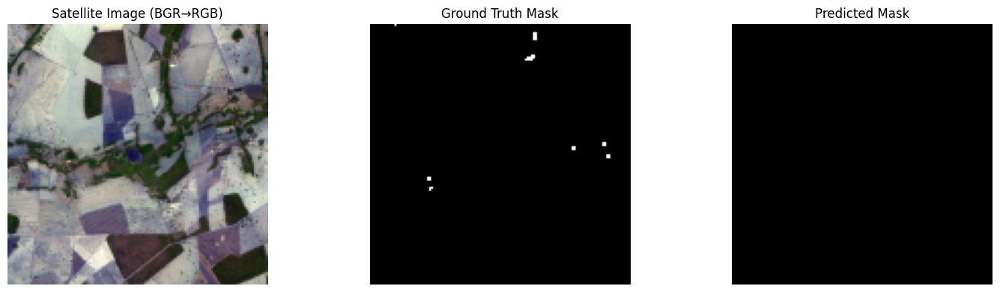

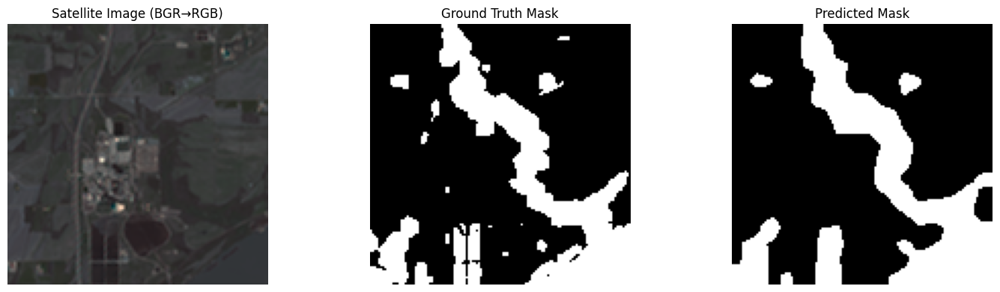

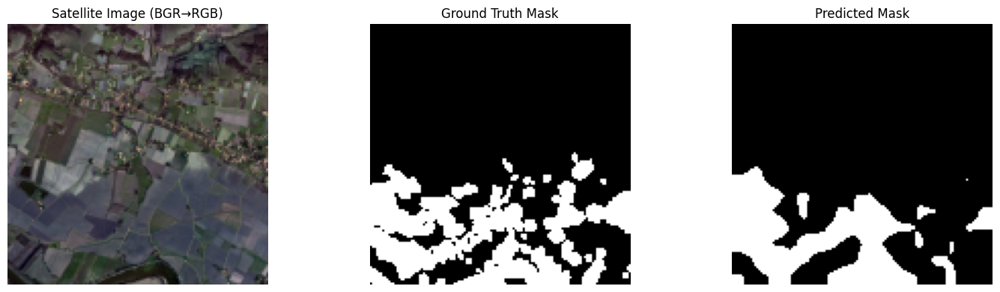

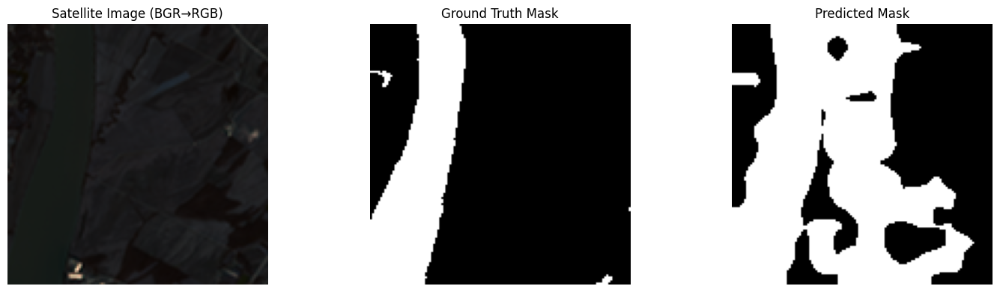

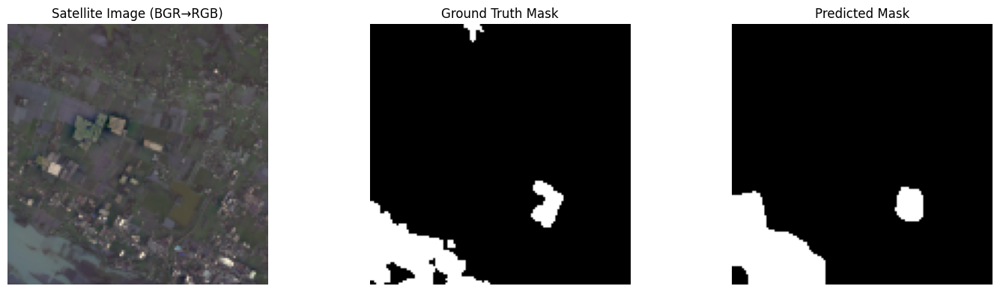

🔍 Visualizing Predictions:   0%|          | 0/8 [00:01<?, ?it/s]


In [169]:
visualize_predictions(model, val_loader, device, num_samples=5)